In [2]:
!pip uninstall scikit-learn-intelex

^C


In [3]:
import modin.pandas as pd
import numpy as np
from tqdm.notebook import tqdm
from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.linear_model import LogisticRegression
import joblib

ImportError: cannot import name 'sparse_lsqr' from 'sklearn.utils.fixes' (C:\Users\kvray\AppData\Roaming\Python\Python38\site-packages\sklearn\utils\fixes.py)

In [ ]:
df = pd.read_csv("train_bank_marketing.csv")

In [3]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,43,management,married,unknown,unknown,no,no,cellular,apr,thu,...,2,999,0,nonexistent,-1.8,93.075,-47.1,1.410,5099.1,0
1,30,admin.,married,university.degree,no,no,no,cellular,jul,fri,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,0
2,55,admin.,married,basic.4y,no,no,no,telephone,jun,thu,...,4,999,0,nonexistent,1.4,94.465,-41.8,4.866,5228.1,0
3,34,technician,single,university.degree,no,no,no,cellular,oct,fri,...,1,999,0,nonexistent,-3.4,92.431,-26.9,0.720,5017.5,1
4,32,blue-collar,married,basic.6y,unknown,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30886,34,blue-collar,married,high.school,no,yes,no,telephone,may,fri,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
30887,39,services,married,high.school,no,no,no,telephone,may,tue,...,2,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,0
30888,23,student,single,unknown,no,no,no,cellular,jul,tue,...,2,16,1,success,-1.7,94.215,-40.3,0.876,4991.6,1
30889,43,blue-collar,married,basic.4y,unknown,no,no,telephone,jun,thu,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.958,5228.1,0


In [4]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                   int64
dtype: object

In [5]:
job = {"admin.":1,"blue-collar":2,"entrepreneur":3,
       "housemaid":4,"management":5,"retired":6,
       "self-employed":7,"services":8,"student":9,
       "technician":10,"unemployed":11,"unknown":0}

civil = {"divorced":1,"married":2,"single":3,"unknown":0}

educ = {"basic.4y":1,"basic.6y":2,"basic.9y":3,
        "high.school":4,"illiterate":5,"professional.course":6,
        "university.degree":7,"unknown":0}

binary = {"no":0,"yes":1,"unknown":1}

contact = {"cellular":0,"telephone":1}

month = {'jan': 1,
        'feb': 2,
        'mar': 3,
        'apr': 4,
        'may': 5,
        'jun': 6,
        'jul': 7,
        'aug': 8,
        'sep': 9,
        'oct': 10,
        'nov': 11,
        'dec': 12}

day = {"mon":1,"tue":2,"wed":3,"thu":4,"fri":5}
poutcome = {"failure":0,"nonexistent":1,"success":2}


In [6]:
df['job'] = df['job'].apply(lambda x: job[x])
df['marital'] = df['marital'].apply(lambda x: civil[x])
df['education'] = df['education'].apply(lambda x: educ[x])
df['default'] = df['default'].apply(lambda x: binary[x])
df['housing'] = df['housing'].apply(lambda x: binary[x])
df['loan'] = df['loan'].apply(lambda x: binary[x])
df['contact'] = df['contact'].apply(lambda x: contact[x])
df['month'] = df['month'].apply(lambda x: month[x])
df['day_of_week'] = df['day_of_week'].apply(lambda x: day[x])
df['poutcome'] = df['poutcome'].apply(lambda x: poutcome[x])

In [9]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,emp_std,price_std,conf_std,euri_std,nremp_std,emp_count,price_count,conf_count,euri_count,nremp_count
0,43,5,2,0,1,0,0,0,4,4,...,1.530428,0.562251,4.552455,1.671139,68.939189,2228,2228,2228,2228,2228
1,30,1,2,7,0,0,0,0,7,5,...,1.619852,0.574460,4.750547,1.769459,75.893818,7840,7840,7840,7840,7840
2,55,1,2,1,0,0,0,1,6,4,...,1.619852,0.574460,4.750547,1.769459,75.893818,7840,7840,7840,7840,7840
3,34,10,3,7,0,0,0,0,10,5,...,1.515163,0.537007,4.560869,1.664106,71.333829,5067,5067,5067,5067,5067
4,32,2,2,2,1,0,0,1,5,4,...,1.444132,0.564063,4.141377,1.650958,59.721876,6914,6914,6914,6914,6914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30886,34,2,2,4,0,1,0,1,5,5,...,1.444132,0.564063,4.141377,1.650958,59.721876,6914,6914,6914,6914,6914
30887,39,8,2,4,0,0,0,1,5,2,...,1.468619,0.561753,4.193546,1.671734,63.503402,2921,2921,2921,2921,2921
30888,23,9,3,0,0,0,0,0,7,2,...,1.484208,0.707133,6.156032,1.577079,79.439199,666,666,666,666,666
30889,43,2,2,1,1,0,0,1,6,4,...,1.444132,0.564063,4.141377,1.650958,59.721876,6914,6914,6914,6914,6914


In [8]:
grouped_df = df.groupby('job')
 
df[['emp_mean', 'price_mean', 'conf_mean', 'euri_mean', 'nremp_mean']] = grouped_df[['emp.var.rate',  'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']].transform('mean')
 
df[['emp_std', 'price_std', 'conf_std', 'euri_std', 'nremp_std']] = grouped_df[['emp.var.rate',  'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']].transform('std')
 
df[['emp_count', 'price_count', 'conf_count', 'euri_count', 'nremp_count']] = grouped_df[['emp.var.rate',  'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']].transform('count')
X = df[df.columns.drop(['y'])]
y = df['y']

In [10]:
#logistic regression with ridge penalty
iterations = 30
C_params = [1e-4, 0.001, 1e-2, 0.1, 1, 10, 100, 1000,10000]
ridge_accuracy = {}

for C in tqdm(C_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        ridge_model = LogisticRegression(dual=False, penalty='l2', C=C, solver='saga',max_iter=80)
        ridge_model.fit(X_train, y_train)
    
        train_acc_list.append(ridge_model.score(X_train, y_train))
        test_acc_list.append(ridge_model.score(X_test, y_test))
    
    ridge_accuracy[str(C)] = {'train_acc': np.mean(train_acc_list),
                              'test_acc': np.mean(test_acc_list)}

  0%|          | 0/9 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

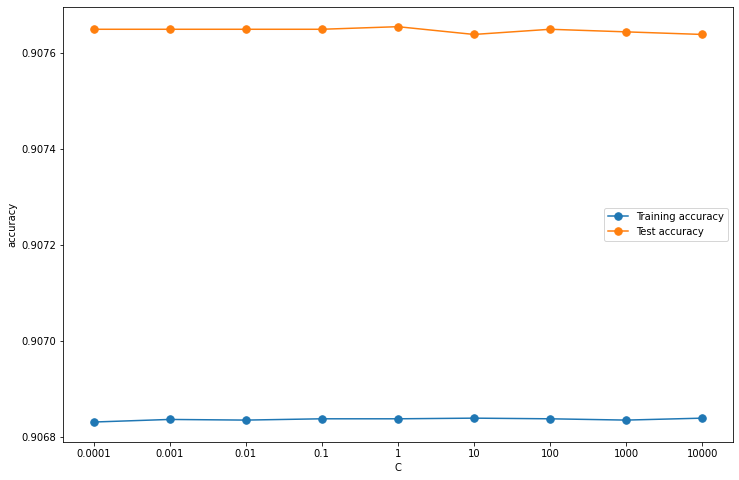

In [11]:
ridge_results = pd.DataFrame(ridge_accuracy).T

plt.figure(figsize=(12, 8))
plt.plot(ridge_results.index, ridge_results['train_acc'], label='Training accuracy', marker='.', markersize=15)
plt.plot(ridge_results.index, ridge_results['test_acc'], label='Test accuracy', marker='.', markersize=15)
plt.legend()
plt.xlabel('C')
plt.ylabel('accuracy')
plt.show()

In [13]:
print(ridge_results['test_acc'].max())

0.907654960349571


In [16]:
ridge_model = LogisticRegression(penalty='l2', C=float(ridge_results['test_acc'].idxmax()), solver='saga')
ridge_model.fit(X, y)
print(ridge_results['test_acc'].idxmax())
joblib.dump(ridge_model, 'ridge_model_nondual.joblib')

1


C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


['ridge_model_nondual.joblib']

In [45]:
ridge_model.coef_

array([[ 0.00666147,  0.00256351,  0.00108304,  0.00394641, -0.0010849 ,
         0.00027004, -0.00012197, -0.00178488,  0.00217221,  0.00044478,
         0.00399204, -0.00333712, -0.00287634,  0.00098555, -0.00018555,
        -0.01248326,  0.00875432, -0.0002283 , -0.01329596, -0.00036618]])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

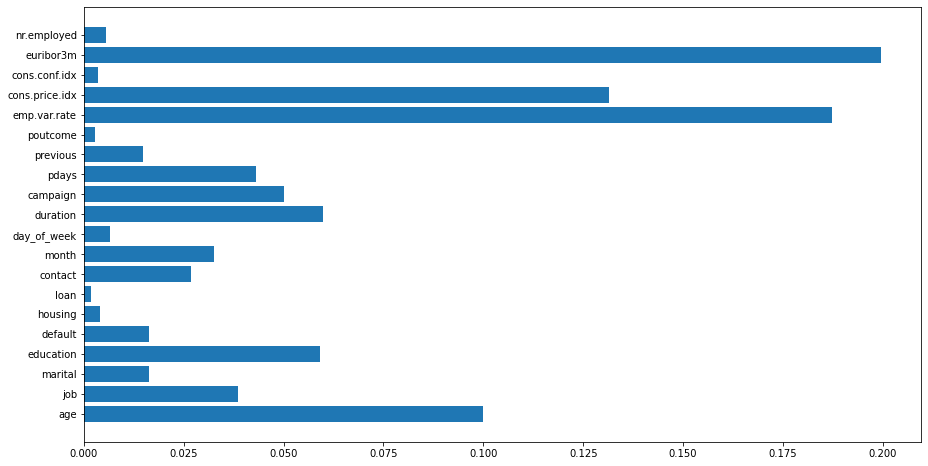

In [49]:
ridge_coefs = (abs(ridge_model.coef_) / abs(ridge_model.coef_).sum(axis=1))[0]
plt.figure(figsize=(15, 8))
plt.barh(y=X.columns,
         width=ridge_coefs)
plt.show()

In [24]:
# log reg with lasso penalty
iterations = 30
C_params = [1e-4, 0.001, 1e-2, 0.1, 1, 10, 100, 1000,10000]
lasso_accuracy = {}

for C in tqdm(C_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        lasso_model = LogisticRegression(dual=False,penalty='l1', C=C, solver='saga',max_iter=80)
        lasso_model.fit(X_train, y_train)
    
        train_acc_list.append(lasso_model.score(X_train, y_train))
        test_acc_list.append(lasso_model.score(X_test, y_test))
    
    lasso_accuracy[str(C)] = {'train_acc': np.mean(train_acc_list),
                              'test_acc': np.mean(test_acc_list)}

  0%|          | 0/9 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

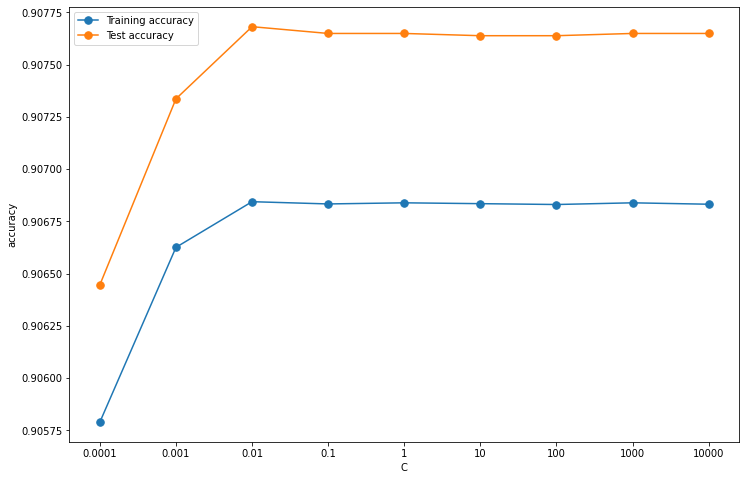

In [25]:
lasso_results = pd.DataFrame(lasso_accuracy).T

plt.figure(figsize=(12, 8))
plt.plot(lasso_results.index, lasso_results['train_acc'], label='Training accuracy', marker='.', markersize=15)
plt.plot(lasso_results.index, lasso_results['test_acc'], label='Test accuracy', marker='.', markersize=15)
plt.legend()
plt.xlabel('C')
plt.ylabel('accuracy')
plt.show()

In [27]:
lasso_model = LogisticRegression(penalty='l1', C=float(lasso_results['test_acc'].idxmax()), solver='saga')
lasso_model.fit(X, y)
print(lasso_results['test_acc'].max())
joblib.dump(lasso_model, 'lasso_model_nondual.joblib')

0.9076819334304365


C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


['lasso_model_nondual.joblib']

In [22]:
import time
from sklearn.model_selection import GridSearchCV

dual=[True,False]
max_iter=[1, 10, 20, 40, 80, 100,110,120,130,140]

param_grid = dict(dual=dual,max_iter=max_iter)


log_sci_model = LogisticRegression(penalty='l1', C=1, solver='saga')
grid = GridSearchCV(estimator=log_sci_model, param_grid=param_grid, cv = 3, n_jobs=-1)

start_time = time.time()
grid_result = grid.fit(X, y)
# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("Execution time: " + str((time.time() - start_time)) + ' ms')


C:\Users\kvray\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.90055356 0.9061539
 0.90644524 0.90667185 0.90676896 0.90644524 0.90654236 0.90654236
 0.90644524 0.90654236]
  warnings.warn(


Best: 0.906769 using {'dual': False, 'max_iter': 80}
Execution time: 8.119994878768921 ms


C:\Users\kvray\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


In [23]:
#SVC using ridge penalty
from sklearn.svm import LinearSVC, SVC
iterations = 20
C_params = [1e-4, 0.001, 1e-2, 0.1, 1, 10, 100, 1000,10000]
svc_accuracy = {}

for C in tqdm(C_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        svc_model = LinearSVC(penalty ='l2', C=C, max_iter=1000)
        svc_model.fit(X_train, y_train)
    
        train_acc_list.append(svc_model.score(X_train, y_train))
        test_acc_list.append(svc_model.score(X_test, y_test))
    
    svc_accuracy[str(C)] = {'train_acc': np.mean(train_acc_list),
                            'test_acc': np.mean(test_acc_list)}
svc_results = pd.DataFrame(svc_accuracy).T

  0%|          | 0/9 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

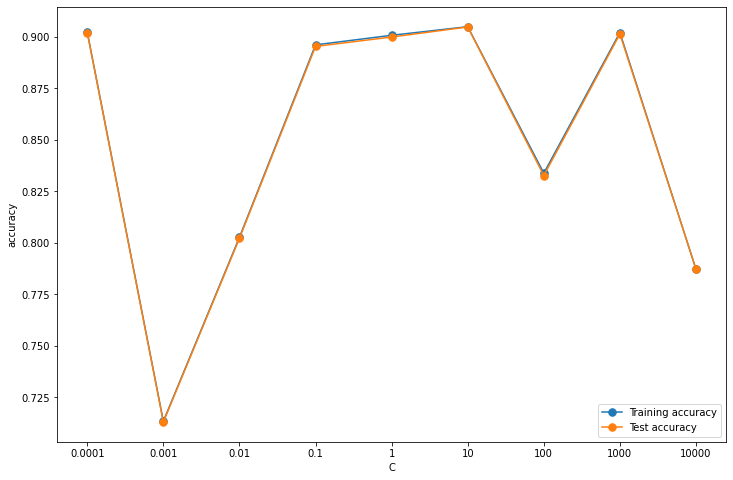

In [24]:
plt.figure(figsize=(12, 8))
plt.plot(svc_results.index, svc_results['train_acc'], label='Training accuracy', marker='.', markersize=15)
plt.plot(svc_results.index, svc_results['test_acc'], label='Test accuracy', marker='.', markersize=15)
plt.legend()
plt.xlabel('C')
plt.ylabel('accuracy')
plt.show()

In [26]:
SVC_model_l2 = LinearSVC(penalty='l2', C=float(svc_results['test_acc'].idxmax()))
SVC_model_l2.fit(X, y)

print(SVC_model_l2.score(X_test, y_test))

0.908561255866645


C:\Users\kvray\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [27]:
import joblib

joblib.dump(SVC_model_l2, 'SVC_l2_20.joblib')

['SVC_l2_20.joblib']

In [28]:
from sklearn.tree import DecisionTreeClassifier

iterations = 20
max_features_params = [0.5, 0.6, 0.7, 0.8]
dt_accuracy = {}

for mf in tqdm(max_features_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        dt_model = DecisionTreeClassifier(max_features=mf)
        dt_model.fit(X_train, y_train)
    
        train_acc_list.append(dt_model.score(X_train, y_train))
        test_acc_list.append(dt_model.score(X_test, y_test))
    
    dt_accuracy[str(mf)] = {'train_acc': np.mean(train_acc_list),
                            'test_acc': np.mean(test_acc_list)}

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
dt_accuracy

{'0.5': {'train_acc': 1.0, 'test_acc': 0.888638938339537},
 '0.6': {'train_acc': 1.0, 'test_acc': 0.8891163618708531},
 '0.7': {'train_acc': 1.0, 'test_acc': 0.8887036737336139},
 '0.8': {'train_acc': 1.0, 'test_acc': 0.8884609160058261}}

In [30]:
dt_model1 = DecisionTreeClassifier(max_features=0.6)
dt_model1.fit(X_train, y_train)

joblib.dump(dt_model1, 'dt_model.joblib')

['dt_model.joblib']

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

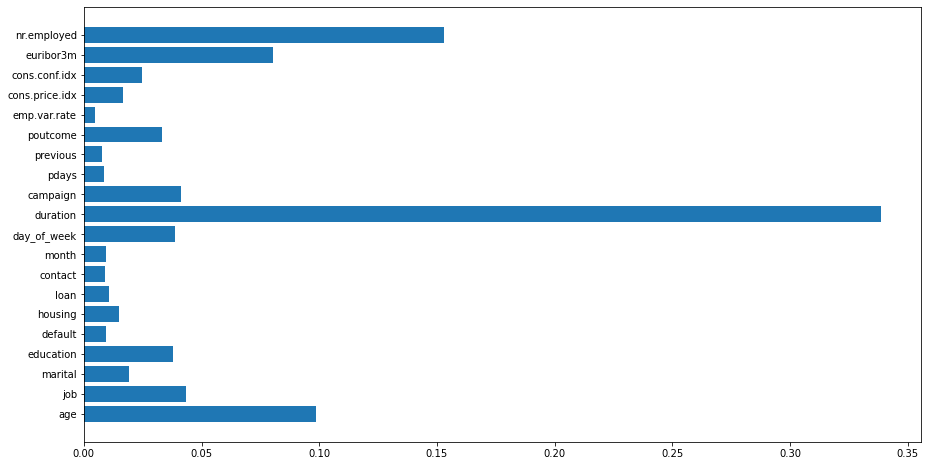

In [35]:
dt_model2 = DecisionTreeClassifier(max_features=0.6)
dt_model2.fit(X, y)
dt_model2.feature_importances_

plt.figure(figsize=(15, 8))
plt.barh(y=X.columns,
         width=dt_model2.feature_importances_)
plt.show()

In [65]:
from sklearn.ensemble import RandomForestClassifier

iterations = 30
max_features_params = [0.5, 0.6, 0.7, 0.8]
rf_accuracy = {}

for mf in tqdm(max_features_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        rf_model = RandomForestClassifier(max_depth=10,max_features=mf, n_jobs=-1)
        rf_model.fit(X_train, y_train)
    
        train_acc_list.append(rf_model.score(X_train, y_train))
        test_acc_list.append(rf_model.score(X_test, y_test))
    
    rf_accuracy[str(mf)] = {'train_acc': np.mean(train_acc_list),
                            'test_acc': np.mean(test_acc_list)}

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [51]:
#max depth of 32
rf_accuracy

{'0.5': {'train_acc': 0.9999824646595445, 'test_acc': 0.9148783514052976},
 '0.6': {'train_acc': 0.99998516240423, 'test_acc': 0.9145061228893564},
 '0.7': {'train_acc': 0.9999865112765726, 'test_acc': 0.9145492798187408},
 '0.8': {'train_acc': 0.9999919067659436, 'test_acc': 0.9139828451205698}}

In [53]:
rf_accuracy

{'0.5': {'train_acc': 0.9999811157872017, 'test_acc': 0.9148513783244324},
 '0.6': {'train_acc': 0.9999878601489154, 'test_acc': 0.9145492798187408},
 '0.7': {'train_acc': 0.9999919067659436, 'test_acc': 0.9144252036467605},
 '0.8': {'train_acc': 0.9999824646595444, 'test_acc': 0.9140853428278578}}

In [55]:
rf_accuracy

{'0.5': {'train_acc': 0.9998961368296105, 'test_acc': 0.9149808491125859},
 '0.6': {'train_acc': 0.9998691593827559, 'test_acc': 0.9142040243836651},
 '0.7': {'train_acc': 0.9998529729146433, 'test_acc': 0.9140745535955117},
 '0.8': {'train_acc': 0.9998502751699578, 'test_acc': 0.913572854291417}}

In [57]:
#max depth of 10
rf_accuracy

{'0.5': {'train_acc': 0.9561818819466925, 'test_acc': 0.9177159195123268},
 '0.6': {'train_acc': 0.9576427106938599, 'test_acc': 0.9173113232993473},
 '0.7': {'train_acc': 0.9590725153771446, 'test_acc': 0.9174407940875006},
 '0.8': {'train_acc': 0.9600288658681341, 'test_acc': 0.9174407940875007}}

In [59]:
rf_accuracy

{'0.5': {'train_acc': 0.920346390417611, 'test_acc': 0.9153368937800074},
 '0.6': {'train_acc': 0.9206876551203195, 'test_acc': 0.9160813508118898},
 '0.7': {'train_acc': 0.9206107693967843, 'test_acc': 0.9161676646706586},
 '0.8': {'train_acc': 0.9203477392899536, 'test_acc': 0.9163618708528887}}

In [64]:
#max depth 12
rf_accuracy

{'0.5': {'train_acc': 0.975629923384051, 'test_acc': 0.9167071262879646},
 '0.6': {'train_acc': 0.977048937088594, 'test_acc': 0.9168042293790797},
 '0.7': {'train_acc': 0.9779971943455272, 'test_acc': 0.9163295031558503},
 '0.8': {'train_acc': 0.9785758605805548, 'test_acc': 0.9160975346604089}}

In [66]:
#max depth of 10
rf_accuracy

{'0.5': {'train_acc': 0.9563181180533075, 'test_acc': 0.9173544802287317},
 '0.6': {'train_acc': 0.9578140174813856, 'test_acc': 0.9175594756433081},
 '0.7': {'train_acc': 0.9589969785259522, 'test_acc': 0.9169229109348869},
 '0.8': {'train_acc': 0.960067983166073, 'test_acc': 0.9173167179155204}}

In [67]:
rf_model1 = RandomForestClassifier(max_features=0.6,max_depth=10,n_jobs=-1)
rf_model1.fit(X, y)

joblib.dump(rf_model1, 'rf_model.joblib')

['rf_model.joblib']

In [68]:
from sklearn.ensemble import GradientBoostingClassifier

iterations = 30
max_features_params = [0.5, 0.6, 0.7, 0.8]
gbm_accuracy = {}

for mf in tqdm(max_features_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        gbm_model = GradientBoostingClassifier(max_features=mf)
        gbm_model.fit(X_train, y_train)
    
        train_acc_list.append(gbm_model.score(X_train, y_train))
        test_acc_list.append(gbm_model.score(X_test, y_test))
    
    gbm_accuracy[str(mf)] = {'train_acc': np.mean(train_acc_list),
                             'test_acc': np.mean(test_acc_list)}

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [69]:
gbm_accuracy

{'0.5': {'train_acc': 0.9234218193590159, 'test_acc': 0.9169876463289638},
 '0.6': {'train_acc': 0.923895273551311, 'test_acc': 0.9169768570966176},
 '0.7': {'train_acc': 0.9240517427430669, 'test_acc': 0.9172681663699627},
 '0.8': {'train_acc': 0.9242001187007662, 'test_acc': 0.9172897448346551}}

In [76]:
gbm_accuracy1 = {}
for md in tqdm(range(1,20)):
    for mf in tqdm(max_features_params):
        train_acc_list = []
        test_acc_list = []

        for seed in range(iterations):
            X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                                test_size=0.2, 
                                                                random_state=seed,
                                                                stratify=y)

            gbm_model = GradientBoostingClassifier(max_depth=md, max_features=mf)
            gbm_model.fit(X_train, y_train)

            train_acc_list.append(gbm_model.score(X_train, y_train))
            test_acc_list.append(gbm_model.score(X_test, y_test))

    gbm_accuracy1[str(mf)+'-'+str(md)] = {'train_acc': np.mean(train_acc_list),
                             'test_acc': np.mean(test_acc_list)}

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

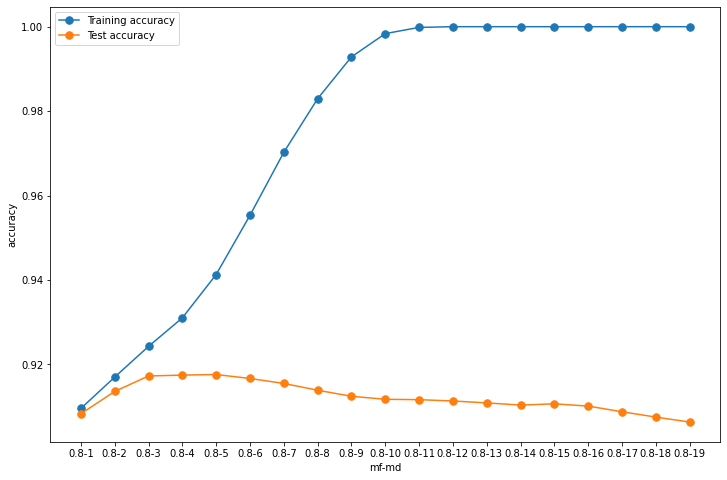

0.8-5


In [78]:
ga = pd.DataFrame(gbm_accuracy1).T
plt.figure(figsize=(12, 8))
plt.plot(ga.index, ga['train_acc'], label='Training accuracy', marker='.', markersize=15)
plt.plot(ga.index, ga['test_acc'], label='Test accuracy', marker='.', markersize=15)
plt.legend()
plt.xlabel('mf-md')
plt.ylabel('accuracy')
plt.show()
print(ga['test_acc'].idxmax())

In [82]:
ga.to_csv('Gbm accuracy.csv')

In [85]:
iterations = 20
max_features_params = [0.5, 0.6, 0.7, 0.8]
gbm_accuracy2 = {}

for mf in tqdm(max_features_params):
    train_acc_list = []
    test_acc_list = []
    
    for seed in range(iterations):
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.2, 
                                                            random_state=seed,
                                                            stratify=y)

        gbm_model = GradientBoostingClassifier(max_depth=5,max_features=mf)
        gbm_model.fit(X_train, y_train)
    
        train_acc_list.append(gbm_model.score(X_train, y_train))
        test_acc_list.append(gbm_model.score(X_test, y_test))
    
    gbm_accuracy2[str(mf)] = {'train_acc': np.mean(train_acc_list),
                             'test_acc': np.mean(test_acc_list)}

  0%|          | 0/4 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [86]:
gbm_accuracy2

{'0.5': {'train_acc': 0.9400149724830043, 'test_acc': 0.9167826509143874},
 '0.6': {'train_acc': 0.9405531725477502, 'test_acc': 0.9166855478232723},
 '0.7': {'train_acc': 0.940965927484623, 'test_acc': 0.9170092247936559},
 '0.8': {'train_acc': 0.9414555681450307, 'test_acc': 0.9169525813238388}}

In [89]:
import time
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
k_neighbors = list(range(5,15))
leaf_size = list(range(30,45))
param_grid = dict(leaf_size=leaf_size,n_neighbors=k_neighbors)

knn_model = KNeighborsClassifier()
grid = GridSearchCV(estimator=knn_model, param_grid=param_grid, cv = 5, n_jobs=-1)

start_time = time.time()
grid_result = grid.fit(X, y)
# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("Execution time: " + str((time.time() - start_time)) + ' ms')

C:\Users\kvray\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]
  warnings.warn(


Best: nan using {'leaf_size': 30, 'n_neighbors': 5}
Execution time: 181.79159665107727 ms


In [93]:
X1=X.to_numpy()
y1=y.to_numpy()
knn_accuracy = {}
kf = StratifiedKFold(n_splits=5)
k_neighbors = list(range(5,10))
for k in tqdm(k_neighbors):
    train_acc_list=[]
    test_acc_list=[]
    for train_index, test_index in kf.split(X1, y1):
        print(train_index, test_index)
        X_train, X_test = X1[train_index], X1[test_index]
        y_train, y_test = y1[train_index], y1[test_index]
        knn_model = KNeighborsClassifier(leaf_size=35, n_neighbors=k, n_jobs=-1)
        knn_model.fit(X_train,y_train)
        train_acc_list.append(knn_model.score(X_train, y_train))
        test_acc_list.append( knn_model.score(X_test, y_test))
    knn_accuracy[str(k)] ={'train_acc' : np.mean(train_acc_list),
                            'test_acc' : np.mean(test_acc_list)}

<IPython.core.display.Javascript object>

  0%|          | 0/5 [00:00<?, ?it/s]

[ 6167  6168  6170 ... 30888 30889 30890] [   0    1    2 ... 6232 6234 6259]
[    0     1     2 ... 30888 30889 30890] [ 6167  6168  6170 ... 12432 12437 12438]
[    0     1     2 ... 30888 30889 30890] [12351 12352 12353 ... 18844 18850 18861]
[    0     1     2 ... 30888 30889 30890] [18491 18492 18493 ... 24810 24825 24834]
[    0     1     2 ... 24810 24825 24834] [24696 24697 24698 ... 30888 30889 30890]
[ 6167  6168  6170 ... 30888 30889 30890] [   0    1    2 ... 6232 6234 6259]
[    0     1     2 ... 30888 30889 30890] [ 6167  6168  6170 ... 12432 12437 12438]
[    0     1     2 ... 30888 30889 30890] [12351 12352 12353 ... 18844 18850 18861]
[    0     1     2 ... 30888 30889 30890] [18491 18492 18493 ... 24810 24825 24834]
[    0     1     2 ... 24810 24825 24834] [24696 24697 24698 ... 30888 30889 30890]
[ 6167  6168  6170 ... 30888 30889 30890] [   0    1    2 ... 6232 6234 6259]
[    0     1     2 ... 30888 30889 30890] [ 6167  6168  6170 ... 12432 12437 12438]
[    0    

In [94]:
knn_accuracy

{'5': {'train_acc': 0.9305137494461017, 'test_acc': 0.9031110239776107},
 '6': {'train_acc': 0.9253909048751143, 'test_acc': 0.9051828133082264},
 '7': {'train_acc': 0.9263134942588636, 'test_acc': 0.9062187263106887},
 '8': {'train_acc': 0.9233676526891289, 'test_acc': 0.9069308837549631},
 '9': {'train_acc': 0.9241283980235544, 'test_acc': 0.9073517109691442}}

In [9]:
import optuna
import pandas as pd
from sklearn import linear_model
from sklearn import datasets
from sklearn import model_selection

#Grabbing a sklearn Classification dataset:

#Step 1. Define an objective function to be maximized.
def objective(trial):

    classifier_name = trial.suggest_categorical("classifier", ["GBC", "RandomForest"])
    
    # Step 2. Setup values for the hyperparameters:
    if classifier_name == 'GBC':
        max_depth = trial.suggest_int("max_depth", 3, 15, log=True)
        max_features = trial.suggest_categorical("max_features",[0.5, 0.6, 0.7, 0.8])
        classifier_obj = GradientBoostingClassifier(max_depth=max_depth,max_features=max_features)
    else:
        rf_n_estimators = trial.suggest_int("rf_n_estimators", 10, 1000)
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        classifier_obj = RandomForestClassifier(
            max_depth=rf_max_depth, n_estimators=rf_n_estimators
        )

    for step in range(100):
        
        # Report intermediate objective value.
        intermediate_value = np.mean(model_selection.cross_val_score(classifier_obj, X, y, n_jobs=-1, cv=5))
        trial.report(intermediate_value, step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
        return intermediate_value

# Step 4: Running it
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

[I 2022-05-11 13:25:25,612] A new study created in memory with name: no-name-9a06b650-911a-4887-ba99-9f6a8ae49765


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:34,061] Trial 0 finished with value: 0.9124988558925476 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 466, 'rf_max_depth': 8}. Best is trial 0 with value: 0.9124988558925476.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:38,107] Trial 1 finished with value: 0.9158008325172862 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.5}. Best is trial 1 with value: 0.9158008325172862.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:41,507] Trial 2 finished with value: 0.9009096328791675 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 238, 'rf_max_depth': 3}. Best is trial 1 with value: 0.9158008325172862.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:45,451] Trial 3 finished with value: 0.9034022860982732 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 323, 'rf_max_depth': 4}. Best is trial 1 with value: 0.9158008325172862.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:47,337] Trial 4 finished with value: 0.9169015018705732 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.6}. Best is trial 4 with value: 0.9169015018705732.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:49,452] Trial 5 finished with value: 0.9177108147978321 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.7}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:25:53,249] Trial 6 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:00,603] Trial 7 finished with value: 0.9154770821982853 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 365, 'rf_max_depth': 20}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:03,088] Trial 8 finished with value: 0.9170956870960554 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.5}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:08,776] Trial 9 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:28,811] Trial 10 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:30,548] Trial 11 finished with value: 0.9162540798203755 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.5}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:34,618] Trial 12 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:37,726] Trial 13 finished with value: 0.9172252259936393 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:40,269] Trial 14 finished with value: 0.9166101664012931 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:43,340] Trial 15 finished with value: 0.9172576094082385 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:51,074] Trial 16 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:54,122] Trial 17 finished with value: 0.9168367874332443 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:26:59,142] Trial 18 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:02,194] Trial 19 finished with value: 0.9169015018705731 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:04,795] Trial 20 finished with value: 0.9170309831371005 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.7}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:07,620] Trial 21 finished with value: 0.9171928792533489 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:09,941] Trial 22 finished with value: 0.9170310198114091 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:13,547] Trial 23 finished with value: 0.9170633403557649 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:18,346] Trial 24 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:20,918] Trial 25 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:23,343] Trial 26 finished with value: 0.9169986416359969 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:26,283] Trial 27 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:30,470] Trial 28 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:31,443] Trial 29 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:34,308] Trial 30 finished with value: 0.9170310198114093 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:37,184] Trial 31 finished with value: 0.9169986102008751 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:40,513] Trial 32 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:42,715] Trial 33 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:45,752] Trial 34 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:27:59,539] Trial 35 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:06,261] Trial 36 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:19,388] Trial 37 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:29,886] Trial 38 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:32,909] Trial 39 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:33,212] Trial 40 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:35,576] Trial 41 finished with value: 0.9171604277293192 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.5}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:38,281] Trial 42 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:40,789] Trial 43 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:44,310] Trial 44 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:46,702] Trial 45 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:49,145] Trial 46 finished with value: 0.9172575622555559 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.5}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:28:50,727] Trial 47 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:03,259] Trial 48 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:06,909] Trial 49 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:09,664] Trial 50 finished with value: 0.9172575884514906 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:12,479] Trial 51 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:15,406] Trial 52 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:19,174] Trial 53 finished with value: 0.917095744727112 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.8}. Best is trial 5 with value: 0.9177108147978321.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:21,494] Trial 54 finished with value: 0.9177431982124313 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:23,342] Trial 55 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:25,290] Trial 56 finished with value: 0.9174194845677391 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.7}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:27,254] Trial 57 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:29,246] Trial 58 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:48,123] Trial 59 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:52,873] Trial 60 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:55,377] Trial 61 finished with value: 0.9171604905995625 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:29:58,399] Trial 62 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:00,509] Trial 63 finished with value: 0.9171281281417112 and parameters: {'classifier': 'GBC', 'max_depth': 3, 'max_features': 0.7}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:04,188] Trial 64 finished with value: 0.9173870540004572 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:07,522] Trial 65 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:11,346] Trial 66 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:15,565] Trial 67 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:18,522] Trial 68 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:24,312] Trial 69 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:26,181] Trial 70 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:29,012] Trial 71 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:33,843] Trial 72 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:44,932] Trial 73 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:47,837] Trial 74 finished with value: 0.9171604644036279 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:52,020] Trial 75 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:54,266] Trial 76 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:30:57,511] Trial 77 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:07,206] Trial 78 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:09,910] Trial 79 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:14,337] Trial 80 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:17,099] Trial 81 finished with value: 0.9173547177385405 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:19,941] Trial 82 finished with value: 0.9171280705106547 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:22,820] Trial 83 finished with value: 0.9171928111439185 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.8}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:26,559] Trial 84 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:36,774] Trial 85 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:44,095] Trial 86 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:46,959] Trial 87 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:49,483] Trial 88 finished with value: 0.9172252259936393 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.5}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:53,798] Trial 89 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:56,015] Trial 90 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:31:58,054] Trial 91 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:00,159] Trial 92 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:15,030] Trial 93 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:17,413] Trial 94 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:19,606] Trial 95 finished with value: 0.9173546705858578 and parameters: {'classifier': 'GBC', 'max_depth': 4, 'max_features': 0.6}. Best is trial 54 with value: 0.9177431982124313.


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:21,959] Trial 96 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:23,886] Trial 97 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:26,181] Trial 98 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 13:32:29,218] Trial 99 pruned. 


  Number of finished trials:  100
  Number of pruned trials:  64
  Number of complete trials:  36


In [98]:
X1=X.to_numpy()
y1=y.to_numpy()

In [99]:
from sklearn.model_selection import StratifiedKFold
#Stratified kfold
max_features_params = [0.5, 0.6, 0.7, 0.8]
gbm_accuracy3 = {}
kf = StratifiedKFold(n_splits=5)

train_acc_list=[]
test_acc_list=[]
for train_index, test_index in kf.split(X1, y1):
    print(train_index, test_index)
    X_train, X_test = X1[train_index], X1[test_index]
    y_train, y_test = y1[train_index], y1[test_index]
    gbm_model3 = GradientBoostingClassifier(max_features=0.5,max_depth=4)
    gbm_model3.fit(X_train,y_train)
    train_acc_list.append(gbm_model3.score(X_train, y_train))
    test_acc_list.append( gbm_model3.score(X_test, y_test))
gbm_accuracy3[str(mf)] ={'train_acc' : np.mean(train_acc_list),
                            'test_acc' : np.mean(test_acc_list)}

[ 6167  6168  6170 ... 30888 30889 30890] [   0    1    2 ... 6232 6234 6259]
[    0     1     2 ... 30888 30889 30890] [ 6167  6168  6170 ... 12432 12437 12438]
[    0     1     2 ... 30888 30889 30890] [12351 12352 12353 ... 18844 18850 18861]
[    0     1     2 ... 30888 30889 30890] [18491 18492 18493 ... 24810 24825 24834]
[    0     1     2 ... 24810 24825 24834] [24696 24697 24698 ... 30888 30889 30890]


In [100]:
gbm_accuracy3 #0.5 not 0.8

{'0.8': {'train_acc': 0.9300848201582068, 'test_acc': 0.9171604801211887}}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

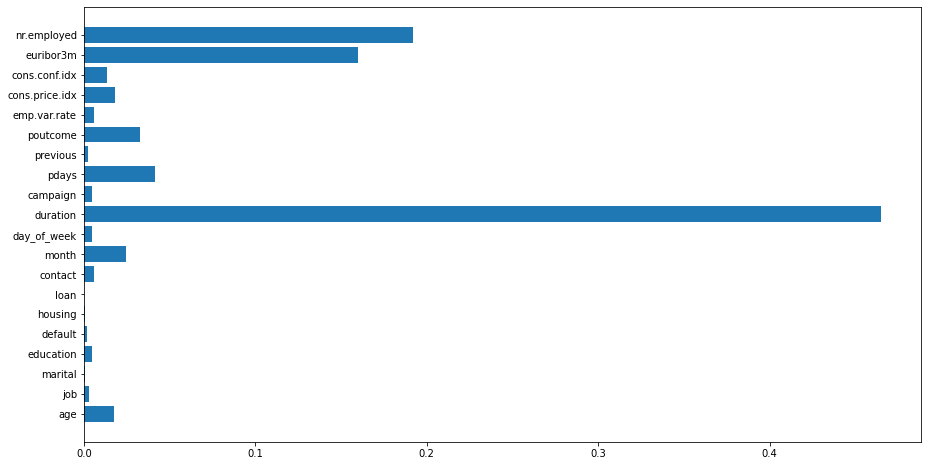

In [103]:
gbm_model3.feature_importances_
plt.figure(figsize=(15, 8))
plt.barh(y=X.columns,
         width=gbm_model3.feature_importances_)
plt.show()

In [101]:
gbm_model3 = GradientBoostingClassifier(max_features=0.5,max_depth=4)
gbm_model3.fit(X,y)

import joblib
joblib.dump(gbm_model3,'gbm_model3.joblib')

['gbm_model3.joblib']

In [125]:
from sklearn.model_selection import StratifiedKFold
#Stratified kfold GBC with less features
max_features_params = [0.5, 0.6, 0.7, 0.8]
gbm_accuracy4 = {}
kf = StratifiedKFold(n_splits=5)
X2 = df[['nr.employed','euribor3m','duration']]
train_acc_list=[]
test_acc_list=[]
for train_index, test_index in kf.split(X2, y):
    print(train_index, test_index)
    X_train, X_test = X1[train_index], X1[test_index]
    y_train, y_test = y1[train_index], y1[test_index]
    gbm_model4 = GradientBoostingClassifier(max_features=0.5,max_depth=4)
    gbm_model4.fit(X_train,y_train)
    train_acc_list.append(gbm_model4.score(X_train, y_train))
    test_acc_list.append( gbm_model4.score(X_test, y_test))
gbm_accuracy4[str(mf)] ={'train_acc' : np.mean(train_acc_list),
                            'test_acc' : np.mean(test_acc_list)}

[ 6167  6168  6170 ... 30888 30889 30890] [   0    1    2 ... 6232 6234 6259]
[    0     1     2 ... 30888 30889 30890] [ 6167  6168  6170 ... 12432 12437 12438]
[    0     1     2 ... 30888 30889 30890] [12351 12352 12353 ... 18844 18850 18861]
[    0     1     2 ... 30888 30889 30890] [18491 18492 18493 ... 24810 24825 24834]
[    0     1     2 ... 24810 24825 24834] [24696 24697 24698 ... 30888 30889 30890]


In [126]:
gbm_accuracy4

{'0.8': {'train_acc': 0.9301171875271201, 'test_acc': 0.9173223081280065}}

In [128]:
my_prefinalgbm = gbm_model4 = GradientBoostingClassifier(max_features=0.5,max_depth=4)
my_prefinalgbm.fit(X,y)
joblib.dump(my_prefinalgbm,'my_prefinalgbm.joblib')

['my_prefinalgbm.joblib']

In [130]:
#hyperparam tuning with 3 params
import optuna
import pandas as pd
from sklearn import linear_model
from sklearn import datasets
from sklearn import model_selection

#Grabbing a sklearn Classification dataset:

#Step 1. Define an objective function to be maximized.
def objective(trial):

    classifier_name = trial.suggest_categorical("classifier", ["GBC", "RandomForest"])
    
    # Step 2. Setup values for the hyperparameters:
    if classifier_name == 'GBC':
        max_depth = trial.suggest_int("max_depth", 3, 15, log=True)
        max_features = trial.suggest_categorical("max_features",[0.5, 0.6, 0.7, 0.8])
        n_estimators = trial.suggest_int('n_estimators',10,1000)
        classifier_obj = GradientBoostingClassifier(max_depth=max_depth,max_features=max_features, n_estimators=n_estimators)
    else:
        rf_n_estimators = trial.suggest_int("rf_n_estimators", 10, 1000)
        rf_max_features = trial.suggest_categorical("rf_max_features",[0.5, 0.6, 0.7, 0.8])
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        classifier_obj = RandomForestClassifier(
            max_depth=rf_max_depth, n_estimators=rf_n_estimators, max_features=rf_max_features
        )

    for step in range(100):
        
        # Report intermediate objective value.
        intermediate_value = np.mean(model_selection.cross_val_score(classifier_obj, X, y, n_jobs=-1, cv=5))
        trial.report(intermediate_value, step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
        return intermediate_value

# Step 4: Running it
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

[I 2022-05-05 12:48:45,196] A new study created in memory with name: no-name-98a29b49-74fd-40de-8e21-614e0ef09203
[I 2022-05-05 12:49:05,983] Trial 0 finished with value: 0.917128170055207 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 699, 'rf_max_features': 0.6, 'rf_max_depth': 7}. Best is trial 0 with value: 0.917128170055207.
[I 2022-05-05 12:49:30,990] Trial 1 finished with value: 0.9174194845677391 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 948, 'rf_max_features': 0.5, 'rf_max_depth': 8}. Best is trial 1 with value: 0.9174194845677391.
[I 2022-05-05 12:49:35,816] Trial 2 finished with value: 0.9114954363276107 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 195, 'rf_max_features': 0.8, 'rf_max_depth': 3}. Best is trial 1 with value: 0.9174194845677391.
[I 2022-05-05 12:49:56,396] Trial 3 finished with value: 0.9119809517831861 and parameters: {'classifier': 'GBC', 'max_depth': 6, 'max_features': 0.5, 'n_estimators': 648}

[I 2022-05-05 13:09:53,962] Trial 46 finished with value: 0.9176784890142894 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 547, 'rf_max_features': 0.8, 'rf_max_depth': 7}. Best is trial 35 with value: 0.9179049685881926.
[I 2022-05-05 13:09:56,197] Trial 47 pruned. 
[I 2022-05-05 13:10:08,890] Trial 48 pruned. 
[I 2022-05-05 13:10:30,462] Trial 49 pruned. 
[I 2022-05-05 13:11:08,849] Trial 50 pruned. 
[I 2022-05-05 13:11:25,669] Trial 51 finished with value: 0.9177108462329538 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 429, 'rf_max_features': 0.8, 'rf_max_depth': 7}. Best is trial 35 with value: 0.9179049685881926.
[I 2022-05-05 13:11:43,985] Trial 52 finished with value: 0.9174194636109911 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 422, 'rf_max_features': 0.8, 'rf_max_depth': 8}. Best is trial 35 with value: 0.9179049685881926.
[I 2022-05-05 13:11:58,475] Trial 53 pruned. 
[I 2022-05-05 13:12:14,707] Trial 54 pruned. 
[

  Number of finished trials:  100
  Number of pruned trials:  59
  Number of complete trials:  41


In [131]:
from sklearn.neural_network import MLPClassifier
mlp_gs = MLPClassifier(max_iter=100)
parameter_space = {
    'hidden_layer_sizes': [(10,30,10),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
from sklearn.model_selection import GridSearchCV
clf = GridSearchCV(mlp_gs, parameter_space, n_jobs=-1, cv=5)
clf.fit(X, y)
print('Best parameters found:\n', clf.best_params_)

Best parameters found:
 {'activation': 'relu', 'alpha': 0.05, 'hidden_layer_sizes': (10, 30, 10), 'learning_rate': 'adaptive', 'solver': 'adam'}


In [ ]:
mlp_gs = MLPClassifier(max_iter=150)
parameter_space = {
    'hidden_layer_sizes': [(10,30,10),(20,),(5,2),(7,1)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam','lbfgs'],
    'alpha': [0.05,1e-4, 0.001, 1e-2, 0.1, 1, 10, 100, 1000,10000],
    'learning_rate': ['constant','adaptive'],
}
clf = GridSearchCV(mlp_gs, parameter_space, n_jobs=-1, cv=5)
start_time = time.time()
grid_result = clf.fit(pred, ans)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("Execution time: " + str((time.time() - start_time)) + ' ms')

In [9]:
clean = df.copy()

<ipython-input-18-6792074d9721>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


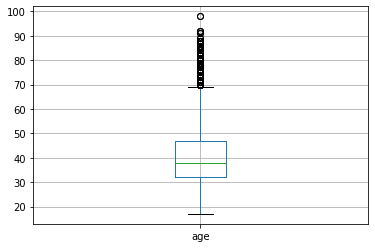

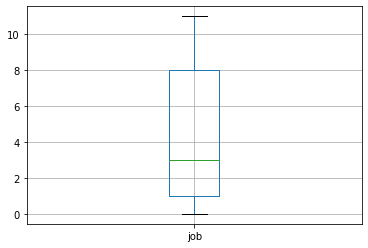

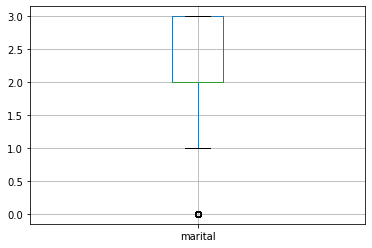

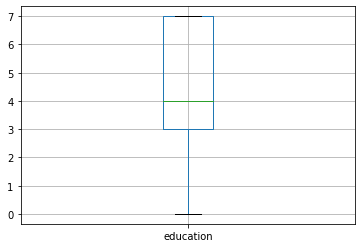

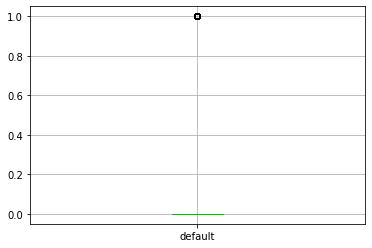

...

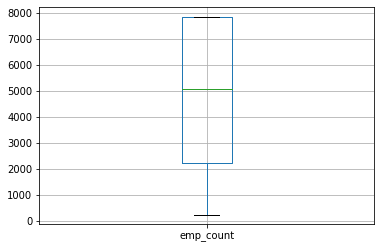

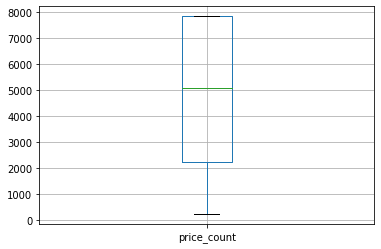

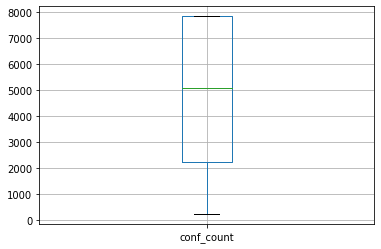

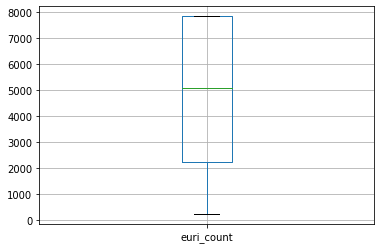

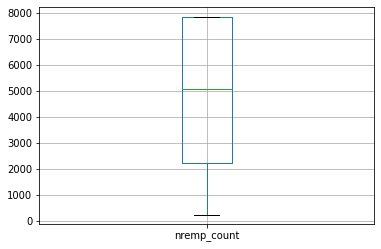

In [18]:
import matplotlib.pyplot as plt

for column in df:
    plt.figure()
    df.boxplot([column])

In [14]:
Q1 = np.percentile(clean['duration'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(clean['duration'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1


<ipython-input-14-c50ed9fb4ccb>:1: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)
  Q1 = np.percentile(clean['duration'], 25,
<ipython-input-14-c50ed9fb4ccb>:4: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)
  Q3 = np.percentile(clean['duration'], 75,


In [16]:
upper = clean[clean['duration'] >= (Q3+1.5*IQR)]

In [19]:
upper

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1,30,1,2,7,0,0,0,0,7,5,1164,2,999,0,1,1.4,93.918,-42.7,4.963,5228.1,0
5,35,7,2,7,0,0,0,0,7,4,1175,2,999,0,1,1.4,93.918,-42.7,4.958,5228.1,1
51,25,1,2,4,0,1,0,0,11,4,702,1,999,0,1,-3.4,92.649,-30.1,0.714,5017.5,0
57,42,10,2,6,1,1,0,0,7,4,721,10,999,0,1,1.4,93.918,-42.7,4.968,5228.1,0
58,52,8,2,4,1,1,0,0,7,5,946,3,999,0,1,1.4,93.918,-42.7,4.962,5228.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30820,39,11,3,3,0,1,0,1,5,1,846,2,999,0,1,-1.8,92.893,-46.2,1.354,5099.1,0
30845,43,7,2,4,1,1,0,0,4,3,902,2,999,0,1,-1.8,93.075,-47.1,1.445,5099.1,0
30862,33,1,3,4,0,1,0,0,4,3,961,2,999,1,0,-1.8,93.075,-47.1,1.372,5099.1,1
30876,46,5,2,7,0,1,0,1,5,2,716,2,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0


In [10]:
pred = upper[upper.columns.drop(['y'])]
ans = upper['y']

NameError: name 'upper' is not defined

In [30]:
#hyperparam tuning with 3 params
import optuna
import pandas as pd
from sklearn import linear_model
from sklearn import model_selection

#Grabbing a sklearn Classification dataset:

#Step 1. Define an objective function to be maximized.
def objective(trial):

    classifier_name = trial.suggest_categorical("classifier", ["GBC", "RandomForest"])
    
    # Step 2. Setup values for the hyperparameters:
    if classifier_name == 'GBC':
        max_depth = trial.suggest_int("max_depth", 3, 15, log=True)
        max_features = trial.suggest_categorical("max_features",[0.5, 0.6, 0.7, 0.8])
        n_estimators = trial.suggest_int('n_estimators',10,1000)
        classifier_obj = GradientBoostingClassifier(max_depth=max_depth,max_features=max_features, n_estimators=n_estimators)
    else:
        rf_n_estimators = trial.suggest_int("rf_n_estimators", 10, 1000)
        rf_max_features = trial.suggest_categorical("rf_max_features",[0.5, 0.6, 0.7, 0.8])
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        classifier_obj = RandomForestClassifier(
            max_depth=rf_max_depth, n_estimators=rf_n_estimators, max_features=rf_max_features
        )

    for step in range(100):
        
        # Report intermediate objective value.
        intermediate_value = np.mean(model_selection.cross_val_score(classifier_obj,pred, ans, n_jobs=-1, cv=5))
        trial.report(intermediate_value, step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
        return intermediate_value

# Step 4: Running it
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

[I 2022-05-11 14:19:10,082] A new study created in memory with name: no-name-0a2ce841-76f8-4ffd-9c7a-f768c7b3be57


<IPython.core.display.Javascript object>

[I 2022-05-11 14:19:28,064] Trial 0 finished with value: 0.9129520403253932 and parameters: {'classifier': 'GBC', 'max_depth': 5, 'max_features': 0.8, 'n_estimators': 430}. Best is trial 0 with value: 0.9129520403253932.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:19:32,079] Trial 1 finished with value: 0.9163835872828378 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 92, 'rf_max_features': 0.7, 'rf_max_depth': 5}. Best is trial 1 with value: 0.9163835872828378.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:20:17,935] Trial 2 finished with value: 0.9152505240365777 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 875, 'rf_max_features': 0.7, 'rf_max_depth': 17}. Best is trial 1 with value: 0.9163835872828378.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:21:18,858] Trial 3 finished with value: 0.9114306537808513 and parameters: {'classifier': 'GBC', 'max_depth': 13, 'max_features': 0.6, 'n_estimators': 491}. Best is trial 1 with value: 0.9163835872828378.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:21:31,621] Trial 4 finished with value: 0.9124664148468918 and parameters: {'classifier': 'GBC', 'max_depth': 7, 'max_features': 0.7, 'n_estimators': 273}. Best is trial 1 with value: 0.9163835872828378.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:21:46,133] Trial 5 finished with value: 0.9154771503077159 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 312, 'rf_max_features': 0.6, 'rf_max_depth': 32}. Best is trial 1 with value: 0.9163835872828378.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:21:49,096] Trial 6 finished with value: 0.9164806903739529 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 147, 'rf_max_features': 0.6, 'rf_max_depth': 5}. Best is trial 6 with value: 0.9164806903739529.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:00,219] Trial 7 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:36,592] Trial 8 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:37,680] Trial 9 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:44,952] Trial 10 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:45,689] Trial 11 finished with value: 0.9158008849091559 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 22, 'rf_max_features': 0.7, 'rf_max_depth': 6}. Best is trial 6 with value: 0.9164806903739529.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:22:52,908] Trial 12 finished with value: 0.9168044354537667 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 313, 'rf_max_features': 0.6, 'rf_max_depth': 6}. Best is trial 12 with value: 0.9168044354537667.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:23:06,130] Trial 13 finished with value: 0.917387059239644 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 381, 'rf_max_features': 0.6, 'rf_max_depth': 10}. Best is trial 13 with value: 0.917387059239644.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:23:22,571] Trial 14 finished with value: 0.9174841413740115 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 455, 'rf_max_features': 0.6, 'rf_max_depth': 11}. Best is trial 14 with value: 0.9174841413740115.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:23:48,421] Trial 15 finished with value: 0.9160274430708636 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 628, 'rf_max_features': 0.6, 'rf_max_depth': 14}. Best is trial 14 with value: 0.9174841413740115.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:24:06,197] Trial 16 finished with value: 0.9169986102008751 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 446, 'rf_max_features': 0.6, 'rf_max_depth': 12}. Best is trial 14 with value: 0.9174841413740115.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:24:41,033] Trial 17 finished with value: 0.9175165090710496 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 770, 'rf_max_features': 0.8, 'rf_max_depth': 10}. Best is trial 17 with value: 0.9175165090710496.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:25:26,033] Trial 18 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:25:55,235] Trial 19 finished with value: 0.9176460374902596 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 738, 'rf_max_features': 0.8, 'rf_max_depth': 9}. Best is trial 19 with value: 0.9176460374902596.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:26:31,509] Trial 20 finished with value: 0.9172252312328262 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 997, 'rf_max_features': 0.8, 'rf_max_depth': 8}. Best is trial 19 with value: 0.9176460374902596.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:26:59,369] Trial 21 finished with value: 0.917451794633721 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 678, 'rf_max_features': 0.8, 'rf_max_depth': 9}. Best is trial 19 with value: 0.9176460374902596.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:27:43,140] Trial 22 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:28:02,312] Trial 23 finished with value: 0.9179373677203527 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 543, 'rf_max_features': 0.5, 'rf_max_depth': 12}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:28:10,692] Trial 24 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:28:29,684] Trial 25 finished with value: 0.9169015490232557 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 749, 'rf_max_features': 0.5, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:28:45,395] Trial 26 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:29:14,583] Trial 27 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:29:55,334] Trial 28 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:30:49,969] Trial 29 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:31:42,255] Trial 30 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:31:57,988] Trial 31 finished with value: 0.9175165352669845 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 489, 'rf_max_features': 0.5, 'rf_max_depth': 11}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:32:14,441] Trial 32 finished with value: 0.9176783789913632 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 556, 'rf_max_features': 0.5, 'rf_max_depth': 10}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:32:27,271] Trial 33 finished with value: 0.9177432139299923 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 538, 'rf_max_features': 0.5, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:32:41,416] Trial 34 finished with value: 0.9174194950461129 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 580, 'rf_max_features': 0.5, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:32:54,242] Trial 35 finished with value: 0.917031046007344 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 522, 'rf_max_features': 0.5, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:32:55,314] Trial 36 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:33:13,218] Trial 37 finished with value: 0.9175488977248358 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 665, 'rf_max_features': 0.5, 'rf_max_depth': 9}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:33:18,158] Trial 38 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:33:29,789] Trial 39 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:33:36,556] Trial 40 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:33:54,842] Trial 41 finished with value: 0.9170633298773909 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 656, 'rf_max_features': 0.5, 'rf_max_depth': 9}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:34:13,193] Trial 42 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:34:29,826] Trial 43 finished with value: 0.9172252836246958 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 676, 'rf_max_features': 0.7, 'rf_max_depth': 6}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:34:43,708] Trial 44 finished with value: 0.9174842513969376 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 596, 'rf_max_features': 0.5, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:34:51,816] Trial 45 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:35:04,331] Trial 46 finished with value: 0.9172252050368914 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 478, 'rf_max_features': 0.5, 'rf_max_depth': 9}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:00,462] Trial 47 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:14,229] Trial 48 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:25,732] Trial 49 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:30,677] Trial 50 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:45,567] Trial 51 finished with value: 0.9178078759754514 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 504, 'rf_max_features': 0.5, 'rf_max_depth': 11}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:36:59,021] Trial 52 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:37:12,849] Trial 53 finished with value: 0.9174517893945339 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 500, 'rf_max_features': 0.5, 'rf_max_depth': 10}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:37:34,577] Trial 54 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:37:47,772] Trial 55 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:38:01,353] Trial 56 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:38:20,360] Trial 57 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:38:41,709] Trial 58 finished with value: 0.9173871273490747 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 920, 'rf_max_features': 0.5, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:38:55,307] Trial 59 finished with value: 0.9177432086908052 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 578, 'rf_max_features': 0.6, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:39:14,630] Trial 60 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:39:28,849] Trial 61 finished with value: 0.9175813492488656 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 571, 'rf_max_features': 0.6, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:39:40,247] Trial 62 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:39:54,273] Trial 63 finished with value: 0.9173547491736622 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 570, 'rf_max_features': 0.6, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:40:09,296] Trial 64 finished with value: 0.9174194478934303 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 464, 'rf_max_features': 0.6, 'rf_max_depth': 10}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:40:25,880] Trial 65 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:40:38,586] Trial 66 finished with value: 0.9176784994926633 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 528, 'rf_max_features': 0.6, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:40:48,458] Trial 67 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:41:02,759] Trial 68 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:41:14,094] Trial 69 finished with value: 0.9176459641416421 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 353, 'rf_max_features': 0.6, 'rf_max_depth': 10}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:41:38,209] Trial 70 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:41:50,208] Trial 71 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:41:57,018] Trial 72 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:42:10,076] Trial 73 finished with value: 0.9174194321758694 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 407, 'rf_max_features': 0.6, 'rf_max_depth': 10}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:42:14,028] Trial 74 finished with value: 0.9174518208296556 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 143, 'rf_max_features': 0.6, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:42:24,988] Trial 75 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:42:31,830] Trial 76 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:42:55,141] Trial 77 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:43:20,145] Trial 78 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:43:32,684] Trial 79 finished with value: 0.9176137326634649 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 442, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:00,247] Trial 80 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:10,180] Trial 81 finished with value: 0.9177108567113278 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 360, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:20,938] Trial 82 finished with value: 0.9175165719412932 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 349, 'rf_max_features': 0.7, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:33,477] Trial 83 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:48,441] Trial 84 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:44:54,730] Trial 85 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:45:04,149] Trial 86 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:45:13,866] Trial 87 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:45:40,376] Trial 88 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:45:47,687] Trial 89 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:46:02,472] Trial 90 finished with value: 0.9175813125745569 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 428, 'rf_max_features': 0.8, 'rf_max_depth': 8}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:46:15,515] Trial 91 finished with value: 0.9178727004357065 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 474, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:46:32,182] Trial 92 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:46:46,757] Trial 93 finished with value: 0.9176461370348118 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 530, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:47:03,094] Trial 94 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:47:16,997] Trial 95 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:47:24,049] Trial 96 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:47:34,387] Trial 97 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-11 14:47:51,527] Trial 98 finished with value: 0.9176784785359156 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 620, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


<IPython.core.display.Javascript object>

[I 2022-05-11 14:48:08,599] Trial 99 finished with value: 0.9174842356793766 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 618, 'rf_max_features': 0.7, 'rf_max_depth': 7}. Best is trial 23 with value: 0.9179373677203527.


  Number of finished trials:  100
  Number of pruned trials:  52
  Number of complete trials:  48


<AxesSubplot:>

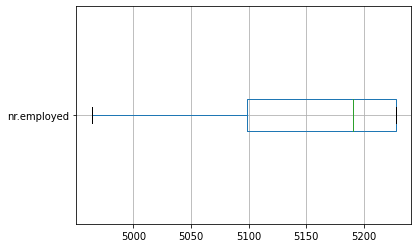

In [24]:
plt.figure()
clean.boxplot(['nr.employed'],vert=False,)

In [10]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
col_names = ['duration']
features = clean[col_names]
clean[col_names] = scaler.fit_transform(features.values)
pred = clean[clean.columns.drop(['y'])]
ans = clean['y']

In [12]:
from lightgbm import LGBMClassifier

C:\Users\kvray\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\kvray\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\kvray\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)


In [16]:
#hyperparam tuning with 3 params
import optuna
import pandas as pd
from sklearn import linear_model
from sklearn import model_selection

#Grabbing a sklearn Classification dataset:

#Step 1. Define an objective function to be maximized.
def objective(trial):

    classifier_name = trial.suggest_categorical("classifier", ["LightGBM",'GBC'])
    
    # Step 2. Setup values for the hyperparameters:
    if classifier_name == 'GBC':
        gbc_max_depth = trial.suggest_int("gbc_max_depth", 3, 15, log=True)
        max_features = trial.suggest_categorical("max_features",[0.5, 0.6, 0.7, 0.8,0.9])
        gbc_n_estimators = trial.suggest_int('gbc_n_estimators',10,1000)
        classifier_obj = GradientBoostingClassifier(max_depth=gbc_max_depth,max_features=max_features, n_estimators=gbc_n_estimators)
    else:
        n_estimators =  trial.suggest_categorical("n_estimators", [10000])
        learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3)
        num_leaves = trial.suggest_int("num_leaves", 20, 3000, step=20)
        max_depth =  trial.suggest_int("max_depth", 3, 12)
        min_data_in_leaf= trial.suggest_int("min_data_in_leaf", 200, 10000, step=100)
        lambda_l1 = trial.suggest_int("lambda_l1", 0, 100, step=5)
        lambda_l2 = trial.suggest_int("lambda_l2", 0, 100, step=5)
        min_gain_to_split = trial.suggest_float("min_gain_to_split", 0, 15)
        bagging_fraction = trial.suggest_float("bagging_fraction", 0.2, 0.9, step=0.1)
        bagging_freq = trial.suggest_categorical("bagging_freq", [1]),
        feature_fraction = trial.suggest_float("feature_fraction", 0.2, 0.9, step=0.1)
        classifier_obj = LGBMClassifier(objective='binary',
                                        n_estimators = n_estimators,
                                        learning_rate = learning_rate,
                                        num_leaves = num_leaves,
                                        min_data_in_leaf = min_data_in_leaf,
                                        lambda_l1 = lambda_l1,
                                        lambda_l2 = lambda_l2,
                                        min_gain_to_split = min_gain_to_split,
                                        bagging_fraction = bagging_fraction,
                                        bagging_freq = bagging_freq,
                                        feature_fraction = feature_fraction,
                                        max_depth=max_depth,
                                        
        )

    for step in range(100):
        
        # Report intermediate objective value.
        intermediate_value = np.mean(model_selection.cross_val_score(classifier_obj,X, y, n_jobs=-1, cv=5))
        trial.report(intermediate_value, step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
        return intermediate_value

# Step 4: Running it
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

[I 2022-05-12 19:03:31,826] A new study created in memory with name: no-name-e73574a7-99bd-48a0-8762-7bc4ac6ebe45
[I 2022-05-12 19:03:54,748] Trial 0 finished with value: 0.8982874879151603 and parameters: {'classifier': 'LightGBM', 'n_estimators': 10000, 'learning_rate': 0.08339291678428191, 'num_leaves': 1460, 'max_depth': 10, 'min_data_in_leaf': 5500, 'lambda_l1': 75, 'lambda_l2': 85, 'min_gain_to_split': 8.725407310896939, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.8982874879151603.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:05:07,291] Trial 1 finished with value: 0.9099414096483086 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 7, 'max_features': 0.7, 'gbc_n_estimators': 855}. Best is trial 1 with value: 0.9099414096483086.
[I 2022-05-12 19:05:23,111] Trial 2 finished with value: 0.9108478885369262 and parameters: {'classifier': 'LightGBM', 'n_estimators': 10000, 'learning_rate': 0.17082973902006685, 'num_leaves': 2040, 'max_depth': 7, 'min_data_in_leaf': 1500, 'lambda_l1': 30, 'lambda_l2': 65, 'min_gain_to_split': 7.351219744213228, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2 with value: 0.9108478885369262.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:05:46,126] Trial 3 finished with value: 0.9112040117921524 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 13, 'max_features': 0.5, 'gbc_n_estimators': 144}. Best is trial 3 with value: 0.9112040117921524.
[I 2022-05-12 19:06:01,763] Trial 4 finished with value: 0.9002946256786908 and parameters: {'classifier': 'LightGBM', 'n_estimators': 10000, 'learning_rate': 0.271334589255927, 'num_leaves': 180, 'max_depth': 5, 'min_data_in_leaf': 7900, 'lambda_l1': 45, 'lambda_l2': 45, 'min_gain_to_split': 8.978094892385396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 3 with value: 0.9112040117921524.
[I 2022-05-12 19:06:14,632] Trial 5 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:06:29,042] Trial 6 finished with value: 0.9151210322916764 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 369}. Best is trial 6 with value: 0.9151210322916764.
[I 2022-05-12 19:06:40,678] Trial 7 pruned. 
[I 2022-05-12 19:06:55,166] Trial 8 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:07:23,934] Trial 9 finished with value: 0.9142469996879017 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.8, 'gbc_n_estimators': 847}. Best is trial 6 with value: 0.9151210322916764.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:07:36,344] Trial 10 finished with value: 0.9172252207544525 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 318}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:07:47,885] Trial 11 finished with value: 0.9151534052279018 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 305}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:08:05,603] Trial 12 finished with value: 0.9155094446561367 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 358}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:08:40,809] Trial 13 finished with value: 0.9127901913618277 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 589}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:09:03,565] Trial 14 finished with value: 0.9134052666717347 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.6, 'gbc_n_estimators': 529}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:09:09,380] Trial 15 finished with value: 0.9168367455197487 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 116}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:09:12,093] Trial 16 finished with value: 0.9140526887219323 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 8, 'max_features': 0.9, 'gbc_n_estimators': 22}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:09:24,005] Trial 17 finished with value: 0.91667490179537 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.7, 'gbc_n_estimators': 195}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:09:26,350] Trial 18 finished with value: 0.9166101349661714 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.5, 'gbc_n_estimators': 42}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:11:46,301] Trial 19 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:12:04,417] Trial 20 finished with value: 0.9158655574329891 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.6, 'gbc_n_estimators': 230}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:12:17,160] Trial 21 finished with value: 0.9166749017953698 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.7, 'gbc_n_estimators': 171}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:12:44,483] Trial 22 finished with value: 0.9159302561527571 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.7, 'gbc_n_estimators': 417}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:12:53,308] Trial 23 finished with value: 0.916351135758808 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.7, 'gbc_n_estimators': 218}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:13:08,365] Trial 24 finished with value: 0.9155418437882968 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.9, 'gbc_n_estimators': 162}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:13:14,347] Trial 25 finished with value: 0.9172252102760785 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 84}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:13:24,035] Trial 26 finished with value: 0.9168043254308407 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.9, 'gbc_n_estimators': 75}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:13:45,408] Trial 27 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:14:10,362] Trial 28 pruned. 
[I 2022-05-12 19:14:21,216] Trial 29 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:15:05,219] Trial 30 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:15:12,211] Trial 31 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:15:24,622] Trial 32 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:15:42,789] Trial 33 finished with value: 0.9157361128407706 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 304}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:15:47,026] Trial 34 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:16:01,632] Trial 35 pruned. 
[I 2022-05-12 19:16:19,328] Trial 36 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:16:39,655] Trial 37 pruned. 
[I 2022-05-12 19:17:01,541] Trial 38 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:18:05,921] Trial 39 pruned. 
[I 2022-05-12 19:18:18,363] Trial 40 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:18:30,595] Trial 41 finished with value: 0.9160597583760323 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.7, 'gbc_n_estimators': 193}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:18:40,591] Trial 42 finished with value: 0.9162864056039182 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.7, 'gbc_n_estimators': 99}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:18:52,040] Trial 43 finished with value: 0.9166749070345567 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 169}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:18:58,608] Trial 44 finished with value: 0.9168044144970189 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 146}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:19:02,110] Trial 45 finished with value: 0.9163188152144522 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 73}. Best is trial 10 with value: 0.9172252207544525.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:19:17,382] Trial 46 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:19:23,626] Trial 47 finished with value: 0.9172252521895741 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 141}. Best is trial 47 with value: 0.9172252521895741.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:19:36,438] Trial 48 finished with value: 0.9159950439387033 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 252}. Best is trial 47 with value: 0.9172252521895741.
[I 2022-05-12 19:19:53,968] Trial 49 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:19:59,169] Trial 50 finished with value: 0.9166425236199576 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.5, 'gbc_n_estimators': 135}. Best is trial 47 with value: 0.9172252521895741.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:20:15,525] Trial 51 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:20:16,526] Trial 52 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:20:33,918] Trial 53 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:20:58,758] Trial 54 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:21:29,181] Trial 55 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:22:07,237] Trial 56 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:22:20,816] Trial 57 finished with value: 0.9166749332304918 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 201}. Best is trial 47 with value: 0.9172252521895741.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:22:26,150] Trial 58 finished with value: 0.9172899980620247 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.6, 'gbc_n_estimators': 99}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:22:40,582] Trial 59 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:22:59,250] Trial 60 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:02,760] Trial 61 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:09,561] Trial 62 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:19,213] Trial 63 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:35,247] Trial 64 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:36,911] Trial 65 finished with value: 0.9168691551302827 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.5, 'gbc_n_estimators': 39}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:49,326] Trial 66 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:23:50,951] Trial 67 finished with value: 0.9167721306269719 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.5, 'gbc_n_estimators': 35}. Best is trial 58 with value: 0.9172899980620247.
[I 2022-05-12 19:24:03,727] Trial 68 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:08,686] Trial 69 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:11,246] Trial 70 finished with value: 0.9168690870208522 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.5, 'gbc_n_estimators': 108}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:13,683] Trial 71 finished with value: 0.9163835401301551 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.5, 'gbc_n_estimators': 104}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:14,854] Trial 72 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:18,034] Trial 73 finished with value: 0.9166748546426872 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.5, 'gbc_n_estimators': 142}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:23,221] Trial 74 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:27,289] Trial 75 finished with value: 0.916383529651781 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.5, 'gbc_n_estimators': 188}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:36,789] Trial 76 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:42,726] Trial 77 finished with value: 0.9164482807634187 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 4, 'max_features': 0.9, 'gbc_n_estimators': 120}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:24:43,396] Trial 78 pruned. 
[I 2022-05-12 19:25:36,202] Trial 79 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:25:44,945] Trial 80 finished with value: 0.9167396162326987 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 3, 'max_features': 0.9, 'gbc_n_estimators': 243}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:25:51,402] Trial 81 finished with value: 0.9169014756746383 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.9, 'gbc_n_estimators': 82}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:25:57,817] Trial 82 finished with value: 0.9164806432212702 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.9, 'gbc_n_estimators': 85}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:06,386] Trial 83 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:10,689] Trial 84 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:17,189] Trial 85 finished with value: 0.9166748651210611 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 108}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:29,282] Trial 86 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:29,724] Trial 87 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:37,036] Trial 88 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:26:59,994] Trial 89 pruned. 
[I 2022-05-12 19:27:16,607] Trial 90 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:27:25,466] Trial 91 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:27:33,459] Trial 92 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:27:59,613] Trial 93 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:04,436] Trial 94 finished with value: 0.9166425131415836 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 6, 'max_features': 0.9, 'gbc_n_estimators': 65}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:07,424] Trial 95 finished with value: 0.9172576775176691 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 45}. Best is trial 58 with value: 0.9172899980620247.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:09,768] Trial 96 finished with value: 0.9172900033012116 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 35}. Best is trial 96 with value: 0.9172900033012116.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:12,243] Trial 97 finished with value: 0.916933948155416 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 39}. Best is trial 96 with value: 0.9172900033012116.


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:13,360] Trial 98 pruned. 


<IPython.core.display.Javascript object>

[I 2022-05-12 19:28:15,991] Trial 99 finished with value: 0.9168367402805616 and parameters: {'classifier': 'GBC', 'gbc_max_depth': 5, 'max_features': 0.9, 'gbc_n_estimators': 41}. Best is trial 96 with value: 0.9172900033012116.


  Number of finished trials:  100
  Number of pruned trials:  50
  Number of complete trials:  50


In [ ]:
#hyperparam tuning with 3 params
import optuna
import pandas as pd
from sklearn import linear_model
from sklearn import model_selection

#Grabbing a sklearn Classification dataset:

#Step 1. Define an objective function to be maximized.
def objective(trial):

    classifier_name = trial.suggest_categorical("classifier", ["LightGBM"])
    
    # Step 2. Setup values for the hyperparameters:
    if classifier_name == 'GBC':
        max_depth = trial.suggest_int("max_depth", 3, 15, log=True)
        max_features = trial.suggest_categorical("max_features",[0.5, 0.6, 0.7, 0.8,0.9])
        n_estimators = trial.suggest_int('n_estimators',10,1000)
        classifier_obj = GradientBoostingClassifier(max_depth=max_depth,max_features=max_features, n_estimators=n_estimators)
    else:
        n_estimators =  trial.suggest_categorical("n_estimators", [10000])
        learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3)
        num_leaves = trial.suggest_int("num_leaves", 20, 3000, step=20)
        max_depth =  trial.suggest_int("max_depth", 3, 12)
        min_data_in_leaf= trial.suggest_int("min_data_in_leaf", 200, 10000, step=100)
        lambda_l1 = trial.suggest_int("lambda_l1", 0, 100, step=5)
        lambda_l2 = trial.suggest_int("lambda_l2", 0, 100, step=5)
        min_gain_to_split = trial.suggest_float("min_gain_to_split", 0, 15)
        bagging_fraction = trial.suggest_float("bagging_fraction", 0.2, 0.95, step=0.1)
        bagging_freq = trial.suggest_categorical("bagging_freq", [1]),
        feature_fraction = trial.suggest_float("feature_fraction", 0.2, 0.95, step=0.1        )
        classifier_obj = LGBMClassifier(objective='binary',
                                        n_estimators = n_estimators,
                                        learning_rate = learning_rate,
                                        num_leaves = num_leaves,
                                        min_data_in_leaf = min_data_in_leaf,
                                        lambda_l1 = lambda_l1,
                                        lambda_l2 = lambda_l2,
                                        min_gain_to_split = min_gain_to_split,
                                        bagging_fraction = bagging_fraction,
                                        bagging_freq = bagging_freq,
                                        feature_fraction = feature_fraction,
                                        max_depth=max_depth, 
                                        
        )

    for step in range(100):
        
        # Report intermediate objective value.
        intermediate_value = np.mean(model_selection.cross_val_score(classifier_obj,pred, ans, n_jobs=-1, cv=5))
        trial.report(intermediate_value, step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
        return intermediate_value

# Step 4: Running it
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

# Calculating the pruned and completed trials
pruned_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]

print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

In [22]:
from optuna.integration import LightGBMPruningCallback
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold
def objective(trial, pred, ans):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(pred, ans)):
        X_train, X_test = pred.iloc[train_idx], pred.iloc[test_idx]
        y_train, y_test = ans[train_idx], ans[test_idx]

        model = LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
            callbacks=[
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=100)
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

[I 2022-05-12 02:12:02,059] A new study created in memory with name: LGBM Classifier
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0237549401496715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237549401496715
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0237549401496715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237549401496715
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored beca

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0237549401496715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237549401496715
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2700 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2701 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2702 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2703 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2704 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0237549401496715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237549401496715
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2469 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2472 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2473 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0237549401496715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237549401496715
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2467 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2468 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2469 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2865 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2866 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2867 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2868 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2869 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=9.906299312991079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.906299312991079
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=9.906299312991079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.906299312991079
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=9.906299312991079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.906299312991079
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.3571215689769123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3571215689769123
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.3571215689769123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3571215689769123
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.3571215689769123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3571215689769123
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.3571215689769123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3571215689769123
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.3571215689769123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3571215689769123
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=13.323981804005387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.323981804005387
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=13.323981804005387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.323981804005387
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=13.323981804005387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.323981804005387
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=13.323981804005387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.323981804005387
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=13.323981804005387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.323981804005387
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Wa

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-pa

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.750104886854308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.750104886854308
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warn

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.750104886854308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.750104886854308
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warn

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.389830528910246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.389830528910246
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.389830528910246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.389830528910246
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.389830528910246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.389830528910246
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because th

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.389830528910246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.389830528910246
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=4.389830528910246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.389830528910246
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:18,249] Trial 6 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopp

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=7.417199783231529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.417199783231529
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:18,442] Trial 10 pruned. Trial was pruned at iteration 1.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=5.02846074688959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.02846074688959
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=5.02846074688959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.02846074688959
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=5.02846074688959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.02846074688959
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=5.02846074688959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.02846074688959
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:19,746] Trial 13 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=7.561564605658904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.561564605658904
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:19,950] Trial 16 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10345122658043415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10345122658043415
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10345122658043415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10345122658043415
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10345122658043415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10345122658043415
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10345122658043415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10345122658043415
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.83718110288158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.83718110288158
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.83718110288158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.83718110288158
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.83718110288158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.83718110288158
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.83718110288158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.83718110288158
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.83718110288158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.83718110288158
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.108394324467113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.108394324467113
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.108394324467113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.108394324467113
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.108394324467113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.108394324467113
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because t

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.108394324467113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.108394324467113
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this 

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.108394324467113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.108394324467113
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=11.995597850991794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.995597850991794
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=11.995597850991794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.995597850991794
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=11.995597850991794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.995597850991794
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=11.995597850991794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.995597850991794
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=11.995597850991794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.995597850991794
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-pa

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.264535529940916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.264535529940916
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.264535529940916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.264535529940916
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.264535529940916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.264535529940916
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.264535529940916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.264535529940916
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:36,581] Trial 22 pruned. Trial was pruned at iteration 2.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=8.92884300101491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.92884300101491
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-pa

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.712241614312623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.712241614312623
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.712241614312623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.712241614312623
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.712241614312623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.712241614312623
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.712241614312623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.712241614312623
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=11.561669065783983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.561669065783983
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:38,528] Trial 29 pruned. Trial was pruned at iteration 18.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_sto

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.893318332213852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.893318332213852
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.893318332213852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.893318332213852
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.893318332213852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.893318332213852
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.893318332213852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.893318332213852
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.351573580351847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351573580351847
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.351573580351847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.351573580351847
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:40,992] Trial 33 pruned. Trial was pruned at iteration 357.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_st

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.7969506745455792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7969506745455792
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.7969506745455792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7969506745455792
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.7969506745455792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7969506745455792
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.7969506745455792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7969506745455792
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:45,016] Trial 39 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.15654004998188437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15654004998188437
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0304474604245706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0304474604245706
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0304474604245706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0304474604245706
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0304474604245706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0304474604245706
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0304474604245706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0304474604245706
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2380693032896604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2380693032896604
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2380693032896604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2380693032896604
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2380693032896604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2380693032896604
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2380693032896604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2380693032896604
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2380693032896604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2380693032896604
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:50,128] Trial 43 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.3088493723225292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3088493723225292
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6948547784072943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6948547784072943
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6948547784072943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6948547784072943
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6948547784072943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6948547784072943
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6948547784072943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6948547784072943
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[I 2022-05-12 02:12:55,823] Trial 45 finished with value: 0.18193468781845423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2781407390578007, 'num_leaves': 2160, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 25, 'lambda_l2': 55, 'min_gain_to_split': 0.6948547784072943, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 42 with value: 0.17945978031046614.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of Lig

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.8042164563570577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042164563570577
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-05-12 02:12:56,137] Trial 47 pruned. Trial was pruned at iteration 281.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:12:56,205] Trial 48 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvr

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7056493451639578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7056493451639578
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7056493451639578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7056493451639578
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7056493451639578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7056493451639578
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7056493451639578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7056493451639578
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7950550268345935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7950550268345935
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7950550268345935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7950550268345935
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7950550268345935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7950550268345935
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7950550268345935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7950550268345935
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7950550268345935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7950550268345935
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.149230582598223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149230582598223
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.149230582598223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149230582598223
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.149230582598223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149230582598223
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is igno

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.149230582598223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149230582598223
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.149230582598223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149230582598223
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.468681840023428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.468681840023428
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-05-12 02:13:11,526] Trial 54 pruned. Trial was pruned at iteration 314.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:11,597] Trial 55 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvr

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6200994892143857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6200994892143857
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6200994892143857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6200994892143857
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6200994892143857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6200994892143857
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6200994892143857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6200994892143857
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6235563504619531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6235563504619531
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6235563504619531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6235563504619531
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6235563504619531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6235563504619531
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6235563504619531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6235563504619531
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6235563504619531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6235563504619531
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:22,278] Trial 62 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5888906339999195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5888906339999195
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-05-12 02:13:22,758] Trial 64 pruned. Trial was pruned at iteration 478.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:22,843] Trial 65 pruned. Trial was pruned at iteration 4.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvr

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.557361867210845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.557361867210845
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.557361867210845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.557361867210845
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.557361867210845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.557361867210845
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.557361867210845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.557361867210845
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:24,573] Trial 67 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.43372845245453767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43372845245453767
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:24,958] Trial 70 pruned. Trial was pruned at iteration 205.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_st

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.07786611175700076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07786611175700076
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.07786611175700076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07786611175700076
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.07786611175700076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07786611175700076
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.07786611175700076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07786611175700076
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.026146440885455924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026146440885455924
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.026146440885455924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026146440885455924
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.026146440885455924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026146440885455924
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.026146440885455924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026146440885455924
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.026146440885455924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026146440885455924
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:36,889] Trial 73 pruned. Trial was pruned at iteration 20.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_sto

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.38043919137315396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38043919137315396
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-05-12 02:13:37,306] Trial 74 pruned. Trial was pruned at iteration 427.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:37,397] Trial 75 pruned. Trial was pruned at iteration 19.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kv

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.035186003706595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.035186003706595
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.035186003706595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.035186003706595
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.035186003706595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.035186003706595
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.035186003706595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.035186003706595
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  warnings.warn(
[I 2022-05-12 02:13:39,311] Trial 76 finished with value: 0.18109136967705214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2571966947900824, 'num_leaves': 2740, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 15, 'lambda_l2': 30, 'min_gain_to_split': 1.035186003706595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 71 with value: 0.17340639448617878.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Use

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.8429700413645713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8429700413645713
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:39,604] Trial 79 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be r

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9110143029603048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9110143029603048
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[I 2022-05-12 02:13:40,462] Trial 81 pruned. Trial was pruned at iteration 551.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:40,551] Trial 82 pruned. Trial was pruned at iteration 20.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kv

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49760970731988696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49760970731988696
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49760970731988696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49760970731988696
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49760970731988696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49760970731988696
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49760970731988696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49760970731988696
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[I 2022-05-12 02:13:45,546] Trial 85 finished with value: 0.17280523168462844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2554245876302508, 'num_leaves': 2360, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 5, 'lambda_l2': 40, 'min_gain_to_split': 0.49760970731988696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 85 with value: 0.17280523168462844.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of Li

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4755985353576837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755985353576837
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4755985353576837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755985353576837
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4755985353576837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755985353576837
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4755985353576837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755985353576837
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4755985353576837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755985353576837
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.4712990056541523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712990056541523
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.4712990056541523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712990056541523
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.4712990056541523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712990056541523
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.4712990056541523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712990056541523
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.4712990056541523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712990056541523
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:50,018] Trial 88 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.501103123472259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.501103123472259
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2022-05-12 02:13:50,246] Trial 91 pruned. Trial was pruned at iteration 0.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stop

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6335328650090621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6335328650090621
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6335328650090621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6335328650090621
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6335328650090621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6335328650090621
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6335328650090621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6335328650090621
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[I 2022-05-12 02:13:52,949] Trial 95 finished with value: 0.1726589792650947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.233247683163755, 'num_leaves': 2060, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0, 'lambda_l2': 40, 'min_gain_to_split': 0.6335328650090621, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 86 with value: 0.1716175350054424.
C:\Users\kvray\anaconda3\lib\site-packages\optuna\distributions.py:545: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightG

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427532624190284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427532624190284
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097212230351294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097212230351294
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097212230351294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097212230351294
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097212230351294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097212230351294
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3097212230351294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3097212230351294
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29022047174450616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29022047174450616
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29022047174450616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29022047174450616
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29022047174450616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29022047174450616
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29022047174450616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29022047174450616
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29022047174450616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29022047174450616
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `st

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.13338382835933307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13338382835933307
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignore

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.13338382835933307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13338382835933307
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.13338382835933307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13338382835933307
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ig

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.13338382835933307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13338382835933307
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.13338382835933307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13338382835933307
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because thi

C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  warnings.warn(
C:\Users\kvray\anaconda3\lib\site-packages\optuna\trial\_trial.py:590: UserWarning: The reported value is ignored becaus

	Best value (rmse): 0.17162
	Best params:
		n_estimators: 10000
		learning_rate: 0.2125214269849473
		num_leaves: 2340
		max_depth: 10
		min_data_in_leaf: 500
		lambda_l1: 0
		lambda_l2: 40
		min_gain_to_split: 0.4755985353576837
		bagging_fraction: 0.8
		bagging_freq: 1
		feature_fraction: 0.8


In [28]:
!pip uninstall -y lightgbm
!apt-get install -y libboost-all-dev
!git clone --recursive https://github.com/Microsoft/LightGBM

'apt-get' is not recognized as an internal or external command,
operable program or batch file.
'gitpython' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
!apt-get install -y libboost-all-dev
!git clone --recursive https://github.com/Microsoft/LightGBM

'apt-get' is not recognized as an internal or external command,
operable program or batch file.


Submodule path 'external_libs/compute': checked out '36350b7de849300bd3d72a05d8bf890ca405a014'
Submodule path 'external_libs/eigen': checked out '3147391d946bb4b6c68edd901f2add6ac1f31f8c'
Submodule path 'external_libs/fast_double_parser': checked out 'ace60646c02dc54c57f19d644e49a61e7e7758ec'
Submodule path 'external_libs/fast_double_parser/benchmarks/dependencies/abseil-cpp': checked out 'd936052d32a5b7ca08b0199a6724724aea432309'
Submodule path 'external_libs/fast_double_parser/benchmarks/dependencies/double-conversion': checked out 'f4cb2384efa55dee0e6652f8674b05763441ab09'
Submodule path 'external_libs/fmt': checked out 'b6f4ceaed0a0a24ccf575fab6c56dd50ccf6f1a9'


Cloning into 'LightGBM'...
Submodule 'include/boost/compute' (https://github.com/boostorg/compute) registered for path 'external_libs/compute'
Submodule 'eigen' (https://gitlab.com/libeigen/eigen.git) registered for path 'external_libs/eigen'
Submodule 'external_libs/fast_double_parser' (https://github.com/lemire/fast_double_parser.git) registered for path 'external_libs/fast_double_parser'
Submodule 'external_libs/fmt' (https://github.com/fmtlib/fmt.git) registered for path 'external_libs/fmt'
Cloning into 'C:/Users/kvray/DECSC 131/LightGBM/external_libs/compute'...
Cloning into 'C:/Users/kvray/DECSC 131/LightGBM/external_libs/eigen'...
remote: warning: core.fsyncObjectFiles is deprecated; use core.fsync instead        
Cloning into 'C:/Users/kvray/DECSC 131/LightGBM/external_libs/fast_double_parser'...
Cloning into 'C:/Users/kvray/DECSC 131/LightGBM/external_libs/fmt'...
Submodule 'benchmark/dependencies/abseil-cpp' (https://github.com/abseil/abseil-cpp.git) registered for path 'exte

In [13]:
!pip install lightgbm

  Using cached lightgbm-3.3.2-py3-none-win_amd64.whl (1.0 MB)


In [8]:
!pip install libboost-all-dev

ERROR: Could not find a version that satisfies the requirement libboost-all-dev
ERROR: No matching distribution found for libboost-all-dev


In [14]:
!apt-get install -y libboost-all-dev

NameError: name 'apt' is not defined

In [16]:
!apt

ERROR: Could not find a version that satisfies the requirement libboost-all-dev
ERROR: No matching distribution found for libboost-all-dev


In [20]:
!pip install xgboost

In [29]:
import optuna 
from optuna import Trial, visualization
from optuna.samplers import TPESampler
from xgboost import XGBClassifier

In [30]:
def objective(trial: Trial,X,y) -> float:
    
    joblib.dump(study, 'study.pkl')

    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 0, 1000),
                'max_depth':trial.suggest_int('max_depth', 2, 25),
                'reg_alpha':trial.suggest_int('reg_alpha', 0, 5),
                'reg_lambda':trial.suggest_int('reg_lambda', 0, 5),
                'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
                'gamma':trial.suggest_int('gamma', 0, 5),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.005,0.5),
                'colsample_bytree':trial.suggest_discrete_uniform('colsample_bytree',0.1,1,0.01),
                'nthread' : -1
            }
    
    model = XGBClassifier(**param)
    
    return cross_val_score(model, X, y, cv=3).mean()

study = optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(lambda trial : objective(trial,X,y),n_trials= 50)

[I 2022-05-12 20:59:06,450] A new study created in memory with name: no-name-2437dfb8-518d-4a35-8162-fb49f4292ccd


<IPython.core.display.Javascript object>

[I 2022-05-12 20:59:19,307] Trial 0 finished with value: 0.9182609821630896 and parameters: {'n_estimators': 518, 'max_depth': 24, 'reg_alpha': 3, 'reg_lambda': 1, 'min_child_weight': 5, 'gamma': 5, 'learning_rate': 0.02699660244129369, 'colsample_bytree': 0.65}. Best is trial 0 with value: 0.9182609821630896.


<IPython.core.display.Javascript object>

[I 2022-05-12 20:59:25,464] Trial 1 finished with value: 0.9174516849567835 and parameters: {'n_estimators': 153, 'max_depth': 25, 'reg_alpha': 5, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.3484458053515661, 'colsample_bytree': 0.82}. Best is trial 0 with value: 0.9182609821630896.


<IPython.core.display.Javascript object>

[I 2022-05-12 20:59:28,823] Trial 2 finished with value: 0.9172250817390178 and parameters: {'n_estimators': 370, 'max_depth': 4, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.08786169916839003, 'colsample_bytree': 0.8}. Best is trial 0 with value: 0.9182609821630896.


<IPython.core.display.Javascript object>

[I 2022-05-12 20:59:30,665] Trial 3 finished with value: 0.906930821274805 and parameters: {'n_estimators': 79, 'max_depth': 24, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.005583852368230355, 'colsample_bytree': 0.48}. Best is trial 0 with value: 0.9182609821630896.


<IPython.core.display.Javascript object>

[I 2022-05-12 20:59:53,102] Trial 4 finished with value: 0.9182933540513418 and parameters: {'n_estimators': 903, 'max_depth': 18, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.00911221591560922, 'colsample_bytree': 0.61}. Best is trial 4 with value: 0.9182933540513418.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:10,916] Trial 5 finished with value: 0.9184228416043507 and parameters: {'n_estimators': 718, 'max_depth': 13, 'reg_alpha': 2, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.021460572185628496, 'colsample_bytree': 0.63}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:15,851] Trial 6 finished with value: 0.9174193130685313 and parameters: {'n_estimators': 222, 'max_depth': 15, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.2113693210226899, 'colsample_bytree': 0.45999999999999996}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:19,517] Trial 7 finished with value: 0.9175164287332881 and parameters: {'n_estimators': 233, 'max_depth': 7, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 2, 'learning_rate': 0.03127952788320016, 'colsample_bytree': 0.73}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:20,766] Trial 8 finished with value: 0.9174840568450358 and parameters: {'n_estimators': 65, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.3454942120376816, 'colsample_bytree': 0.56}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:31,182] Trial 9 finished with value: 0.9158007186559192 and parameters: {'n_estimators': 418, 'max_depth': 16, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.15239510828821148, 'colsample_bytree': 0.38}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:00:42,851] Trial 10 finished with value: 0.9123369266129293 and parameters: {'n_estimators': 775, 'max_depth': 11, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 0, 'learning_rate': 0.015657914489617456, 'colsample_bytree': 0.19}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:01:19,734] Trial 11 finished with value: 0.9176782881745492 and parameters: {'n_estimators': 997, 'max_depth': 19, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.009364536721614367, 'colsample_bytree': 0.97}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:01:36,791] Trial 12 finished with value: 0.9171927098507656 and parameters: {'n_estimators': 741, 'max_depth': 19, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 2, 'learning_rate': 0.01405522233503377, 'colsample_bytree': 0.31}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:01:57,702] Trial 13 finished with value: 0.9161244375384415 and parameters: {'n_estimators': 931, 'max_depth': 19, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.05289794932184382, 'colsample_bytree': 0.5700000000000001}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:02:15,459] Trial 14 finished with value: 0.916998478521252 and parameters: {'n_estimators': 731, 'max_depth': 12, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 1, 'learning_rate': 0.005122055790041371, 'colsample_bytree': 0.92}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:02:33,427] Trial 15 finished with value: 0.9181314946100807 and parameters: {'n_estimators': 637, 'max_depth': 16, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 2, 'learning_rate': 0.021218250749284333, 'colsample_bytree': 0.66}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:02:42,814] Trial 16 finished with value: 0.9076753747046066 and parameters: {'n_estimators': 845, 'max_depth': 20, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.009961855097045998, 'colsample_bytree': 0.13}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:02:46,421] Trial 17 finished with value: 0.9158654624324236 and parameters: {'n_estimators': 602, 'max_depth': 2, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 0, 'learning_rate': 0.051590318147136396, 'colsample_bytree': 0.66}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:03:06,045] Trial 18 finished with value: 0.9157683467676669 and parameters: {'n_estimators': 878, 'max_depth': 13, 'reg_alpha': 0, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 3, 'learning_rate': 0.008221324381186335, 'colsample_bytree': 0.33999999999999997}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:03:17,060] Trial 19 finished with value: 0.9181638664983328 and parameters: {'n_estimators': 636, 'max_depth': 8, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.03426304729469829, 'colsample_bytree': 0.79}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:03:38,101] Trial 20 finished with value: 0.9182286102748373 and parameters: {'n_estimators': 985, 'max_depth': 22, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.01585421412266168, 'colsample_bytree': 0.47}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:03:50,985] Trial 21 finished with value: 0.9183580978278464 and parameters: {'n_estimators': 486, 'max_depth': 22, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 5, 'learning_rate': 0.026821735720698247, 'colsample_bytree': 0.65}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:04:06,401] Trial 22 finished with value: 0.9178077757275581 and parameters: {'n_estimators': 511, 'max_depth': 21, 'reg_alpha': 2, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 5, 'learning_rate': 0.07396641255530527, 'colsample_bytree': 0.61}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:04:16,351] Trial 23 finished with value: 0.917937263280567 and parameters: {'n_estimators': 374, 'max_depth': 17, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.021553575706215956, 'colsample_bytree': 0.73}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:04:38,546] Trial 24 finished with value: 0.918325725939594 and parameters: {'n_estimators': 806, 'max_depth': 22, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.01226279269493034, 'colsample_bytree': 0.72}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:05:01,875] Trial 25 finished with value: 0.917904891392315 and parameters: {'n_estimators': 574, 'max_depth': 23, 'reg_alpha': 2, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 5, 'learning_rate': 0.04245092584028721, 'colsample_bytree': 0.89}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:05:23,239] Trial 26 finished with value: 0.9183904697160985 and parameters: {'n_estimators': 805, 'max_depth': 14, 'reg_alpha': 3, 'reg_lambda': 1, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.02072790008702362, 'colsample_bytree': 0.72}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:05:35,371] Trial 27 finished with value: 0.9176459162862969 and parameters: {'n_estimators': 698, 'max_depth': 10, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.021725414687063647, 'colsample_bytree': 0.51}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:05:48,381] Trial 28 finished with value: 0.9181962383865852 and parameters: {'n_estimators': 432, 'max_depth': 14, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 5, 'learning_rate': 0.0647538143678934, 'colsample_bytree': 0.84}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:05:55,976] Trial 29 finished with value: 0.9169337347447476 and parameters: {'n_estimators': 684, 'max_depth': 6, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 5, 'gamma': 5, 'learning_rate': 0.10569837253655479, 'colsample_bytree': 0.7}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:06:12,370] Trial 30 finished with value: 0.9183580978278463 and parameters: {'n_estimators': 557, 'max_depth': 13, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.02712536428722483, 'colsample_bytree': 1.0}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:06:28,696] Trial 31 finished with value: 0.9183580978278464 and parameters: {'n_estimators': 552, 'max_depth': 13, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.025794029139816894, 'colsample_bytree': 0.99}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:06:40,489] Trial 32 finished with value: 0.918325725939594 and parameters: {'n_estimators': 468, 'max_depth': 11, 'reg_alpha': 3, 'reg_lambda': 1, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.04007317726934275, 'colsample_bytree': 0.86}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:06:47,986] Trial 33 finished with value: 0.917645916286297 and parameters: {'n_estimators': 326, 'max_depth': 14, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.01839104457151679, 'colsample_bytree': 0.62}. Best is trial 5 with value: 0.9184228416043507.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:07:01,400] Trial 34 finished with value: 0.9187465604868731 and parameters: {'n_estimators': 511, 'max_depth': 15, 'reg_alpha': 2, 'reg_lambda': 0, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.027405398896981, 'colsample_bytree': 0.77}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:07:22,996] Trial 35 finished with value: 0.917516428733288 and parameters: {'n_estimators': 810, 'max_depth': 15, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.025092314281781, 'colsample_bytree': 0.77}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:07:29,798] Trial 36 finished with value: 0.9159302062089282 and parameters: {'n_estimators': 289, 'max_depth': 17, 'reg_alpha': 1, 'reg_lambda': 0, 'min_child_weight': 5, 'gamma': 4, 'learning_rate': 0.007050271096612701, 'colsample_bytree': 0.77}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:07:41,236] Trial 37 finished with value: 0.9181638664983328 and parameters: {'n_estimators': 468, 'max_depth': 25, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 5, 'gamma': 5, 'learning_rate': 0.012138469280837283, 'colsample_bytree': 0.67}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:07:57,750] Trial 38 finished with value: 0.9170308504095045 and parameters: {'n_estimators': 665, 'max_depth': 12, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.032438102707063474, 'colsample_bytree': 0.89}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:15,834] Trial 39 finished with value: 0.9174516849567835 and parameters: {'n_estimators': 551, 'max_depth': 15, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.03695372696902017, 'colsample_bytree': 0.94}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:19,155] Trial 40 finished with value: 0.9118513482891456 and parameters: {'n_estimators': 144, 'max_depth': 10, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.01783471877138994, 'colsample_bytree': 0.53}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:38,297] Trial 41 finished with value: 0.9176782881745492 and parameters: {'n_estimators': 612, 'max_depth': 17, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.02646735899398873, 'colsample_bytree': 0.82}. Best is trial 34 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:48,957] Trial 42 finished with value: 0.9188760480398822 and parameters: {'n_estimators': 499, 'max_depth': 12, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.027027066604850287, 'colsample_bytree': 0.59}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:55,625] Trial 43 finished with value: 0.9180020070570717 and parameters: {'n_estimators': 383, 'max_depth': 12, 'reg_alpha': 4, 'reg_lambda': 0, 'min_child_weight': 5, 'gamma': 4, 'learning_rate': 0.0444840483630424, 'colsample_bytree': 0.42000000000000004}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:08:55,816] Trial 44 finished with value: 0.908290440581399 and parameters: {'n_estimators': 3, 'max_depth': 6, 'reg_alpha': 3, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 5, 'learning_rate': 0.012447611076862005, 'colsample_bytree': 0.58}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:09:04,842] Trial 45 finished with value: 0.918455213492603 and parameters: {'n_estimators': 467, 'max_depth': 9, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.030791651350416765, 'colsample_bytree': 0.61}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:09:12,812] Trial 46 finished with value: 0.9184228416043508 and parameters: {'n_estimators': 428, 'max_depth': 9, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.061694479265067485, 'colsample_bytree': 0.7}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:09:19,305] Trial 47 finished with value: 0.9177754038393059 and parameters: {'n_estimators': 422, 'max_depth': 8, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.10309599041403765, 'colsample_bytree': 0.59}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:09:24,594] Trial 48 finished with value: 0.9135670583665144 and parameters: {'n_estimators': 304, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.4912717733853211, 'colsample_bytree': 0.54}. Best is trial 42 with value: 0.9188760480398822.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:09:26,715] Trial 49 finished with value: 0.9168366190799909 and parameters: {'n_estimators': 252, 'max_depth': 4, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.06778673379650903, 'colsample_bytree': 0.69}. Best is trial 42 with value: 0.9188760480398822.


In [31]:
def objective(trial: Trial,X,y) -> float:
    
    joblib.dump(study, 'study.pkl')

    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 0, 1000),
                'max_depth':trial.suggest_int('max_depth', 2, 25),
                'reg_alpha':trial.suggest_int('reg_alpha', 0, 5),
                'reg_lambda':trial.suggest_int('reg_lambda', 0, 5),
                'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
                'gamma':trial.suggest_int('gamma', 0, 5),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.005,0.5),
                'colsample_bytree':trial.suggest_discrete_uniform('colsample_bytree',0.1,1,0.01),
                'nthread' : -1
            }
    
    model = XGBClassifier(**param,objective='binary:hinge',booster='gbtree')
    
    return cross_val_score(model, X, y, cv=3).mean()

study = optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(lambda trial : objective(trial,X,y),n_trials= 50)

[I 2022-05-12 21:12:15,177] A new study created in memory with name: no-name-1e0d5035-742c-4cde-a682-17f34a66d5a5


<IPython.core.display.Javascript object>

[I 2022-05-12 21:12:17,535] Trial 0 finished with value: 0.9013628564954194 and parameters: {'n_estimators': 171, 'max_depth': 16, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.010121338648676323, 'colsample_bytree': 0.17}. Best is trial 0 with value: 0.9013628564954194.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:12:17,877] Trial 1 finished with value: 0.11265417111780131 and parameters: {'n_estimators': 22, 'max_depth': 13, 'reg_alpha': 5, 'reg_lambda': 0, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.01084412820046744, 'colsample_bytree': 0.12000000000000001}. Best is trial 0 with value: 0.9013628564954194.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:12:33,251] Trial 2 finished with value: 0.9185523291573597 and parameters: {'n_estimators': 764, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.016353407088989157, 'colsample_bytree': 0.75}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:12:39,163] Trial 3 finished with value: 0.9051827393091839 and parameters: {'n_estimators': 177, 'max_depth': 19, 'reg_alpha': 0, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 0, 'learning_rate': 0.0434330867326737, 'colsample_bytree': 0.45000000000000007}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:12:45,174] Trial 4 finished with value: 0.9149266776731086 and parameters: {'n_estimators': 235, 'max_depth': 12, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.03626124380461167, 'colsample_bytree': 0.6799999999999999}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:13:08,732] Trial 5 finished with value: 0.9103622414295426 and parameters: {'n_estimators': 465, 'max_depth': 19, 'reg_alpha': 0, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.0384858485316781, 'colsample_bytree': 0.96}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:13:13,165] Trial 6 finished with value: 0.9100061506587679 and parameters: {'n_estimators': 750, 'max_depth': 3, 'reg_alpha': 4, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 0, 'learning_rate': 0.019331637009954345, 'colsample_bytree': 0.25}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:13:30,342] Trial 7 finished with value: 0.9141497523550549 and parameters: {'n_estimators': 773, 'max_depth': 14, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 0, 'learning_rate': 0.011567516310609836, 'colsample_bytree': 0.28}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:13:44,651] Trial 8 finished with value: 0.9111067948593442 and parameters: {'n_estimators': 683, 'max_depth': 14, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 0, 'learning_rate': 0.008477029807181577, 'colsample_bytree': 0.28}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:13:58,745] Trial 9 finished with value: 0.9177106600628014 and parameters: {'n_estimators': 881, 'max_depth': 10, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.02881464994489269, 'colsample_bytree': 0.32}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:14:48,761] Trial 10 finished with value: 0.9093263410054709 and parameters: {'n_estimators': 988, 'max_depth': 25, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.14468982338447695, 'colsample_bytree': 0.76}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:00,156] Trial 11 finished with value: 0.9113657699653621 and parameters: {'n_estimators': 996, 'max_depth': 6, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.1386118968310362, 'colsample_bytree': 0.5}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:12,692] Trial 12 finished with value: 0.9080962092518856 and parameters: {'n_estimators': 590, 'max_depth': 8, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 3, 'learning_rate': 0.37456542383752434, 'colsample_bytree': 0.83}. Best is trial 2 with value: 0.9185523291573597.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:28,711] Trial 13 finished with value: 0.9187465604868731 and parameters: {'n_estimators': 866, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.022615430716359863, 'colsample_bytree': 0.6}. Best is trial 13 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:32,551] Trial 14 finished with value: 0.9172250817390178 and parameters: {'n_estimators': 423, 'max_depth': 4, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.08772661179916098, 'colsample_bytree': 0.66}. Best is trial 13 with value: 0.9187465604868731.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:48,848] Trial 15 finished with value: 0.9187789323751253 and parameters: {'n_estimators': 810, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.01863099637323952, 'colsample_bytree': 0.5700000000000001}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:15:59,350] Trial 16 finished with value: 0.9184228416043507 and parameters: {'n_estimators': 875, 'max_depth': 6, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.07402474523123832, 'colsample_bytree': 0.5700000000000001}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:16:02,291] Trial 17 finished with value: 0.9025606163607524 and parameters: {'n_estimators': 570, 'max_depth': 2, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.0055745859943360145, 'colsample_bytree': 0.43000000000000005}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:16:14,257] Trial 18 finished with value: 0.9174516849567835 and parameters: {'n_estimators': 876, 'max_depth': 7, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 1, 'learning_rate': 0.023161078324303884, 'colsample_bytree': 0.59}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:16:35,420] Trial 19 finished with value: 0.9157359748794147 and parameters: {'n_estimators': 652, 'max_depth': 11, 'reg_alpha': 1, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.005433814234243383, 'colsample_bytree': 0.95}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:16:42,152] Trial 20 finished with value: 0.8961186105985561 and parameters: {'n_estimators': 324, 'max_depth': 18, 'reg_alpha': 0, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 2, 'learning_rate': 0.4790550008093459, 'colsample_bytree': 0.38}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:16:59,689] Trial 21 finished with value: 0.9187141885986209 and parameters: {'n_estimators': 793, 'max_depth': 10, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.016501878999467853, 'colsample_bytree': 0.78}. Best is trial 15 with value: 0.9187789323751253.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:17:17,433] Trial 22 finished with value: 0.9187789323751255 and parameters: {'n_estimators': 847, 'max_depth': 10, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.01638176216888781, 'colsample_bytree': 0.65}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:17:25,990] Trial 23 finished with value: 0.9167395034152341 and parameters: {'n_estimators': 921, 'max_depth': 5, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.05811463579397722, 'colsample_bytree': 0.64}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:17:36,265] Trial 24 finished with value: 0.9184228416043507 and parameters: {'n_estimators': 679, 'max_depth': 8, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.024521636825809098, 'colsample_bytree': 0.53}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:18:02,402] Trial 25 finished with value: 0.9163186688679551 and parameters: {'n_estimators': 826, 'max_depth': 12, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.014177336804845649, 'colsample_bytree': 0.87}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:18:25,028] Trial 26 finished with value: 0.9172898255155223 and parameters: {'n_estimators': 568, 'max_depth': 23, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 5, 'learning_rate': 0.0072385081266451885, 'colsample_bytree': 0.71}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:18:57,646] Trial 27 finished with value: 0.9175811725097925 and parameters: {'n_estimators': 918, 'max_depth': 15, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.029617621664292066, 'colsample_bytree': 0.61}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:19:09,224] Trial 28 finished with value: 0.9112362824123531 and parameters: {'n_estimators': 712, 'max_depth': 9, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.05667649726078156, 'colsample_bytree': 0.51}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:19:35,063] Trial 29 finished with value: 0.9121103233951636 and parameters: {'n_estimators': 831, 'max_depth': 16, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 1, 'learning_rate': 0.0122472624766733, 'colsample_bytree': 0.43000000000000005}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:19:57,745] Trial 30 finished with value: 0.9180020070570717 and parameters: {'n_estimators': 954, 'max_depth': 11, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 5, 'learning_rate': 0.007877605397471722, 'colsample_bytree': 0.5700000000000001}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:20:16,774] Trial 31 finished with value: 0.9182286102748373 and parameters: {'n_estimators': 813, 'max_depth': 10, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.018305139459444807, 'colsample_bytree': 0.82}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:20:28,451] Trial 32 finished with value: 0.9183904697160985 and parameters: {'n_estimators': 814, 'max_depth': 7, 'reg_alpha': 1, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.015457306047081416, 'colsample_bytree': 0.73}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:20:29,656] Trial 33 finished with value: 0.8766954776472112 and parameters: {'n_estimators': 34, 'max_depth': 13, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.021447877284933504, 'colsample_bytree': 0.79}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:20:44,412] Trial 34 finished with value: 0.9173545692920269 and parameters: {'n_estimators': 746, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.010005952035939208, 'colsample_bytree': 0.64}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:20:59,030] Trial 35 finished with value: 0.9128872487132175 and parameters: {'n_estimators': 623, 'max_depth': 11, 'reg_alpha': 0, 'reg_lambda': 0, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.032307989064942894, 'colsample_bytree': 0.91}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:21:11,249] Trial 36 finished with value: 0.9178401476158106 and parameters: {'n_estimators': 789, 'max_depth': 8, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.015447316088537364, 'colsample_bytree': 0.7}. Best is trial 22 with value: 0.9187789323751255.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:21:33,659] Trial 37 finished with value: 0.9189084199281344 and parameters: {'n_estimators': 929, 'max_depth': 12, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.04069512073306112, 'colsample_bytree': 0.47}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:21:44,293] Trial 38 finished with value: 0.9095853161114889 and parameters: {'n_estimators': 926, 'max_depth': 13, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.04100226091164562, 'colsample_bytree': 0.1}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:22:02,172] Trial 39 finished with value: 0.9178401476158103 and parameters: {'n_estimators': 507, 'max_depth': 16, 'reg_alpha': 3, 'reg_lambda': 5, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.04322247251674761, 'colsample_bytree': 0.49}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:22:15,262] Trial 40 finished with value: 0.9131462238192354 and parameters: {'n_estimators': 725, 'max_depth': 12, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.026495487245968282, 'colsample_bytree': 0.18}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:22:32,782] Trial 41 finished with value: 0.9165129001974686 and parameters: {'n_estimators': 869, 'max_depth': 10, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.019425784387071557, 'colsample_bytree': 0.37}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:22:52,848] Trial 42 finished with value: 0.9171927098507656 and parameters: {'n_estimators': 952, 'max_depth': 10, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.01035262579216388, 'colsample_bytree': 0.45999999999999996}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:23:18,181] Trial 43 finished with value: 0.9169661066329998 and parameters: {'n_estimators': 774, 'max_depth': 14, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.034141844583404427, 'colsample_bytree': 0.62}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:23:31,878] Trial 44 finished with value: 0.9176459162862969 and parameters: {'n_estimators': 854, 'max_depth': 7, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.013230710752988883, 'colsample_bytree': 0.76}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:23:50,183] Trial 45 finished with value: 0.9182933540513417 and parameters: {'n_estimators': 990, 'max_depth': 9, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.01849819004042562, 'colsample_bytree': 0.54}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:24:13,665] Trial 46 finished with value: 0.9091321096759574 and parameters: {'n_estimators': 897, 'max_depth': 12, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.054454684544925615, 'colsample_bytree': 0.67}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:24:22,870] Trial 47 finished with value: 0.9166100158622252 and parameters: {'n_estimators': 705, 'max_depth': 5, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.07264555039814748, 'colsample_bytree': 1.0}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:24:40,166] Trial 48 finished with value: 0.9123369266129293 and parameters: {'n_estimators': 766, 'max_depth': 11, 'reg_alpha': 2, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.1101561680511568, 'colsample_bytree': 0.48}. Best is trial 37 with value: 0.9189084199281344.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:25:09,399] Trial 49 finished with value: 0.9117866045126412 and parameters: {'n_estimators': 943, 'max_depth': 15, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.02644010516162518, 'colsample_bytree': 0.55}. Best is trial 37 with value: 0.9189084199281344.


In [34]:
def objective(trial: Trial,X,y) -> float:
    
    joblib.dump(study, 'study.pkl')

    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 100, 1000),
                'max_depth':trial.suggest_int('max_depth', 2, 30),
                'reg_alpha':trial.suggest_int('reg_alpha', 0, 5),
                'reg_lambda':trial.suggest_int('reg_lambda', 0, 5),
                'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
                'gamma':trial.suggest_int('gamma', 0, 5),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.04,0.9),
                'nthread' : -1
            }
    
    model = XGBClassifier(**param,objective='binary:hinge',booster='gbtree')
    
    return cross_val_score(model, X, y, cv=3).mean()

study = optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(lambda trial : objective(trial,X,y),n_trials= 50)

[I 2022-05-12 21:47:50,594] A new study created in memory with name: no-name-ec3948eb-6948-46c4-ad88-0987c7e509f6


<IPython.core.display.Javascript object>

[I 2022-05-12 21:47:55,087] Trial 0 finished with value: 0.9164805283092162 and parameters: {'n_estimators': 182, 'max_depth': 9, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.1724956717485711}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:48:14,627] Trial 1 finished with value: 0.9107507040885694 and parameters: {'n_estimators': 950, 'max_depth': 9, 'reg_alpha': 0, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.07997103333057462}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:48:25,095] Trial 2 finished with value: 0.9058301770742286 and parameters: {'n_estimators': 264, 'max_depth': 16, 'reg_alpha': 0, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.041943512066050376}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:48:46,189] Trial 3 finished with value: 0.9162862969797029 and parameters: {'n_estimators': 816, 'max_depth': 13, 'reg_alpha': 0, 'reg_lambda': 5, 'min_child_weight': 5, 'gamma': 5, 'learning_rate': 0.06849104899214042}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:48:59,683] Trial 4 finished with value: 0.8927195623320708 and parameters: {'n_estimators': 544, 'max_depth': 16, 'reg_alpha': 0, 'reg_lambda': 0, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.4315301446000399}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:49:30,585] Trial 5 finished with value: 0.9002298404065909 and parameters: {'n_estimators': 846, 'max_depth': 25, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.3122548639938662}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:49:56,440] Trial 6 finished with value: 0.8974134861286459 and parameters: {'n_estimators': 897, 'max_depth': 14, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 5, 'gamma': 5, 'learning_rate': 0.45268116494241095}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:05,446] Trial 7 finished with value: 0.9027224758020136 and parameters: {'n_estimators': 546, 'max_depth': 10, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 4, 'gamma': 0, 'learning_rate': 0.18508807295456214}. Best is trial 0 with value: 0.9164805283092162.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:16,437] Trial 8 finished with value: 0.9174516849567835 and parameters: {'n_estimators': 204, 'max_depth': 27, 'reg_alpha': 3, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.049818227621993595}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:30,494] Trial 9 finished with value: 0.9070926807160662 and parameters: {'n_estimators': 406, 'max_depth': 18, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 1, 'learning_rate': 0.07110775037226513}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:35,581] Trial 10 finished with value: 0.9005211874008611 and parameters: {'n_estimators': 140, 'max_depth': 30, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 2, 'learning_rate': 0.761711256992502}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:36,564] Trial 11 finished with value: 0.9088407626816872 and parameters: {'n_estimators': 136, 'max_depth': 2, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.14585551812358374}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:54,337] Trial 12 finished with value: 0.9128872487132176 and parameters: {'n_estimators': 322, 'max_depth': 23, 'reg_alpha': 3, 'reg_lambda': 1, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.1127606822564447}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:50:57,539] Trial 13 finished with value: 0.9140202648020459 and parameters: {'n_estimators': 287, 'max_depth': 4, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.04088765698665627}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:51:32,371] Trial 14 finished with value: 0.9160920656501893 and parameters: {'n_estimators': 691, 'max_depth': 22, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.2946786895971303}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:51:48,038] Trial 15 finished with value: 0.9054093425269496 and parameters: {'n_estimators': 406, 'max_depth': 30, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 2, 'learning_rate': 0.11270620612165051}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:51:50,328] Trial 16 finished with value: 0.915638859214658 and parameters: {'n_estimators': 125, 'max_depth': 7, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.20927237920789246}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:51:57,016] Trial 17 finished with value: 0.8950503382862323 and parameters: {'n_estimators': 227, 'max_depth': 20, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.8953166948910982}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:20,873] Trial 18 finished with value: 0.9160920656501895 and parameters: {'n_estimators': 412, 'max_depth': 25, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.054377680464685905}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:37,677] Trial 19 finished with value: 0.9088407626816872 and parameters: {'n_estimators': 673, 'max_depth': 11, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.10360821121553557}. Best is trial 8 with value: 0.9174516849567835.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:40,917] Trial 20 finished with value: 0.9183580978278463 and parameters: {'n_estimators': 219, 'max_depth': 6, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.24195622255225657}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:45,121] Trial 21 finished with value: 0.9165129001974686 and parameters: {'n_estimators': 195, 'max_depth': 8, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.23863073549138025}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:52,481] Trial 22 finished with value: 0.9180020070570715 and parameters: {'n_estimators': 342, 'max_depth': 6, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.2594443680665627}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:52:56,949] Trial 23 finished with value: 0.9166747596387298 and parameters: {'n_estimators': 345, 'max_depth': 5, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 2, 'learning_rate': 0.35947818073749166}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:00,032] Trial 24 finished with value: 0.9113981418536143 and parameters: {'n_estimators': 500, 'max_depth': 2, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.5403913000329106}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:04,738] Trial 25 finished with value: 0.9177754038393059 and parameters: {'n_estimators': 341, 'max_depth': 6, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.14830783454015706}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:10,609] Trial 26 finished with value: 0.9177106600628014 and parameters: {'n_estimators': 443, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.24585394761099716}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:19,620] Trial 27 finished with value: 0.9153798841086401 and parameters: {'n_estimators': 645, 'max_depth': 4, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.1506060484078992}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:26,582] Trial 28 finished with value: 0.9045353015441391 and parameters: {'n_estimators': 332, 'max_depth': 12, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 0, 'learning_rate': 0.13776520817237076}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:35,761] Trial 29 finished with value: 0.9069955650513095 and parameters: {'n_estimators': 485, 'max_depth': 8, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 1, 'learning_rate': 0.18466066430385034}. Best is trial 20 with value: 0.9183580978278463.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:39,446] Trial 30 finished with value: 0.9184228416043508 and parameters: {'n_estimators': 254, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.26215039172774446}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:43,853] Trial 31 finished with value: 0.9169984785212523 and parameters: {'n_estimators': 264, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.25722238879592074}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:51,774] Trial 32 finished with value: 0.9161244375384415 and parameters: {'n_estimators': 336, 'max_depth': 9, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.36369839884477057}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:54,441] Trial 33 finished with value: 0.916577643973973 and parameters: {'n_estimators': 244, 'max_depth': 4, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.29434399552870066}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:57,652] Trial 34 finished with value: 0.9173545692920269 and parameters: {'n_estimators': 103, 'max_depth': 10, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.21298689522914827}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:53:59,218] Trial 35 finished with value: 0.9091968534524618 and parameters: {'n_estimators': 180, 'max_depth': 2, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.09135495773429925}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:54:12,504] Trial 36 finished with value: 0.9168366190799909 and parameters: {'n_estimators': 374, 'max_depth': 13, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 5, 'learning_rate': 0.16844392484924478}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:54:18,003] Trial 37 finished with value: 0.9171603379625134 and parameters: {'n_estimators': 282, 'max_depth': 7, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.5501916204328421}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:54:33,786] Trial 38 finished with value: 0.901977922372212 and parameters: {'n_estimators': 604, 'max_depth': 14, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 3, 'learning_rate': 0.3668656551542292}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:54:42,347] Trial 39 finished with value: 0.9159302062089282 and parameters: {'n_estimators': 747, 'max_depth': 5, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 0, 'gamma': 4, 'learning_rate': 0.12420786978954552}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:54:54,434] Trial 40 finished with value: 0.9154122559968924 and parameters: {'n_estimators': 476, 'max_depth': 9, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.43708928772499456}. Best is trial 30 with value: 0.9184228416043508.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:03,984] Trial 41 finished with value: 0.9186170729338642 and parameters: {'n_estimators': 429, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.2380622477353447}. Best is trial 41 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:08,860] Trial 42 finished with value: 0.9191026512576479 and parameters: {'n_estimators': 296, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.21548481342927628}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:16,346] Trial 43 finished with value: 0.9174193130685313 and parameters: {'n_estimators': 969, 'max_depth': 3, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.25991966648633363}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:22,161] Trial 44 finished with value: 0.9163834126444595 and parameters: {'n_estimators': 299, 'max_depth': 8, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.20441005486550193}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:32,891] Trial 45 finished with value: 0.9040820951086076 and parameters: {'n_estimators': 376, 'max_depth': 11, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.32189495299937265}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:35,142] Trial 46 finished with value: 0.9172898255155223 and parameters: {'n_estimators': 173, 'max_depth': 5, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.2243687439979554}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:42,023] Trial 47 finished with value: 0.9058949208507331 and parameters: {'n_estimators': 235, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 5, 'gamma': 1, 'learning_rate': 0.16492479346141078}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:50,387] Trial 48 finished with value: 0.9163186688679552 and parameters: {'n_estimators': 572, 'max_depth': 7, 'reg_alpha': 4, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.28618702216455666}. Best is trial 42 with value: 0.9191026512576479.


<IPython.core.display.Javascript object>

[I 2022-05-12 21:55:53,673] Trial 49 finished with value: 0.9129843643779743 and parameters: {'n_estimators': 433, 'max_depth': 3, 'reg_alpha': 3, 'reg_lambda': 1, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.1908094223595588}. Best is trial 42 with value: 0.9191026512576479.


In [35]:
def objective(trial: Trial,X,y) -> float:
    
    joblib.dump(study, 'study.pkl')

    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 100, 1000),
                'max_depth':trial.suggest_int('max_depth', 2, 30),
                'reg_alpha':trial.suggest_int('reg_alpha', 0, 5),
                'reg_lambda':trial.suggest_int('reg_lambda', 0, 5),
                'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
                'gamma':trial.suggest_int('gamma', 0, 5),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.04,0.9),
                'nthread' : -1
            }
    
    model = XGBClassifier(**param,objective='binary:logistic',booster='gbtree')
    
    return cross_val_score(model, X, y, cv=3).mean()

study = optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(lambda trial : objective(trial,X,y),n_trials= 50)

[I 2022-05-12 22:00:09,761] A new study created in memory with name: no-name-925a1bf1-96bd-4d41-bb0a-d92d416bb638


<IPython.core.display.Javascript object>

[I 2022-05-12 22:00:20,078] Trial 0 finished with value: 0.9151856527791266 and parameters: {'n_estimators': 322, 'max_depth': 15, 'reg_alpha': 1, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.0858663933010052}. Best is trial 0 with value: 0.9151856527791266.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:00:53,201] Trial 1 finished with value: 0.9159625780971804 and parameters: {'n_estimators': 982, 'max_depth': 22, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 5, 'gamma': 2, 'learning_rate': 0.2242990917503487}. Best is trial 1 with value: 0.9159625780971804.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:00:58,533] Trial 2 finished with value: 0.9069631931630573 and parameters: {'n_estimators': 316, 'max_depth': 8, 'reg_alpha': 0, 'reg_lambda': 0, 'min_child_weight': 1, 'gamma': 3, 'learning_rate': 0.6671218352091225}. Best is trial 1 with value: 0.9159625780971804.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:01:05,423] Trial 3 finished with value: 0.9173545692920269 and parameters: {'n_estimators': 688, 'max_depth': 4, 'reg_alpha': 2, 'reg_lambda': 2, 'min_child_weight': 5, 'gamma': 0, 'learning_rate': 0.05365164615853653}. Best is trial 3 with value: 0.9173545692920269.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:01:13,248] Trial 4 finished with value: 0.9158007186559193 and parameters: {'n_estimators': 190, 'max_depth': 14, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.8344959371550988}. Best is trial 3 with value: 0.9173545692920269.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:01:14,302] Trial 5 finished with value: 0.9150885371143698 and parameters: {'n_estimators': 145, 'max_depth': 2, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.1346500446103859}. Best is trial 3 with value: 0.9173545692920269.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:01:42,026] Trial 6 finished with value: 0.9185199572691074 and parameters: {'n_estimators': 717, 'max_depth': 19, 'reg_alpha': 2, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.10883967002133411}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:01:51,055] Trial 7 finished with value: 0.9138260334725324 and parameters: {'n_estimators': 589, 'max_depth': 7, 'reg_alpha': 1, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.6755062851724256}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:02:19,503] Trial 8 finished with value: 0.9169984785212523 and parameters: {'n_estimators': 745, 'max_depth': 26, 'reg_alpha': 2, 'reg_lambda': 1, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.12639803512479192}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:02:50,421] Trial 9 finished with value: 0.9171927098507656 and parameters: {'n_estimators': 784, 'max_depth': 16, 'reg_alpha': 1, 'reg_lambda': 0, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.04960103998411138}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:03:25,397] Trial 10 finished with value: 0.9182286102748374 and parameters: {'n_estimators': 984, 'max_depth': 30, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.29169230706940247}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:03:57,832] Trial 11 finished with value: 0.9175811725097924 and parameters: {'n_estimators': 937, 'max_depth': 30, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.29816505792020137}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:04:24,741] Trial 12 finished with value: 0.918455213492603 and parameters: {'n_estimators': 834, 'max_depth': 23, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.4004648719247369}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:04:42,273] Trial 13 finished with value: 0.918325725939594 and parameters: {'n_estimators': 516, 'max_depth': 21, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.3857081808845299}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:05:08,709] Trial 14 finished with value: 0.9171927098507656 and parameters: {'n_estimators': 827, 'max_depth': 21, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.47405032177395956}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:05:29,642] Trial 15 finished with value: 0.918196238386585 and parameters: {'n_estimators': 568, 'max_depth': 24, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.133133716705479}. Best is trial 6 with value: 0.9185199572691074.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:05:56,932] Trial 16 finished with value: 0.9186170729338642 and parameters: {'n_estimators': 856, 'max_depth': 18, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.08068736447880598}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:06:15,132] Trial 17 finished with value: 0.9181638664983328 and parameters: {'n_estimators': 656, 'max_depth': 12, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.07697408814197572}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:06:30,373] Trial 18 finished with value: 0.9156064873264057 and parameters: {'n_estimators': 464, 'max_depth': 18, 'reg_alpha': 3, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.08142353858512259}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:06:51,387] Trial 19 finished with value: 0.9180020070570715 and parameters: {'n_estimators': 889, 'max_depth': 11, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.04065402368713577}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:07:15,041] Trial 20 finished with value: 0.9169013628564954 and parameters: {'n_estimators': 674, 'max_depth': 18, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 1, 'learning_rate': 0.1728443897040097}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:07:43,876] Trial 21 finished with value: 0.9180020070570717 and parameters: {'n_estimators': 856, 'max_depth': 26, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.09949483231497704}. Best is trial 16 with value: 0.9186170729338642.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:08:06,032] Trial 22 finished with value: 0.9190055355928912 and parameters: {'n_estimators': 747, 'max_depth': 19, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.1922996532262069}. Best is trial 22 with value: 0.9190055355928912.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:08:31,393] Trial 23 finished with value: 0.9189407918163867 and parameters: {'n_estimators': 754, 'max_depth': 19, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.17574869633910795}. Best is trial 22 with value: 0.9190055355928912.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:08:55,921] Trial 24 finished with value: 0.9184228416043508 and parameters: {'n_estimators': 795, 'max_depth': 19, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 3, 'learning_rate': 0.19490708961585662}. Best is trial 22 with value: 0.9190055355928912.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:09:14,032] Trial 25 finished with value: 0.9173545692920267 and parameters: {'n_estimators': 611, 'max_depth': 13, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.1725332568812164}. Best is trial 22 with value: 0.9190055355928912.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:09:41,363] Trial 26 finished with value: 0.919264510698909 and parameters: {'n_estimators': 892, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.06402174950032966}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:09:52,253] Trial 27 finished with value: 0.9184228416043507 and parameters: {'n_estimators': 472, 'max_depth': 10, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 5, 'learning_rate': 0.2510113641832056}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:10:21,310] Trial 28 finished with value: 0.9190379074811434 and parameters: {'n_estimators': 920, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.05531262637908588}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:10:53,436] Trial 29 finished with value: 0.9185199572691075 and parameters: {'n_estimators': 915, 'max_depth': 16, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.06333870070159744}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:11:21,243] Trial 30 finished with value: 0.9186818167103686 and parameters: {'n_estimators': 939, 'max_depth': 15, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.04014503396710298}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:11:44,918] Trial 31 finished with value: 0.9190702793693957 and parameters: {'n_estimators': 743, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.06352189236584177}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:12:13,348] Trial 32 finished with value: 0.9192321388106569 and parameters: {'n_estimators': 981, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.06810619294085721}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:12:43,907] Trial 33 finished with value: 0.9189731637046389 and parameters: {'n_estimators': 998, 'max_depth': 16, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.062438851238014494}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:13:04,152] Trial 34 finished with value: 0.9184228416043508 and parameters: {'n_estimators': 920, 'max_depth': 10, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.0681309986879343}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:13:29,582] Trial 35 finished with value: 0.9170632222977565 and parameters: {'n_estimators': 885, 'max_depth': 14, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.0499000458374435}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:13:39,783] Trial 36 finished with value: 0.9124664141659383 and parameters: {'n_estimators': 964, 'max_depth': 8, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 0, 'learning_rate': 0.099842788322384}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:14:10,472] Trial 37 finished with value: 0.9186818167103689 and parameters: {'n_estimators': 999, 'max_depth': 13, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.056614195945749506}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:14:22,127] Trial 38 finished with value: 0.9183580978278464 and parameters: {'n_estimators': 326, 'max_depth': 17, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.0704983181936835}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:14:53,645] Trial 39 finished with value: 0.9176782881745492 and parameters: {'n_estimators': 890, 'max_depth': 21, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 1, 'learning_rate': 0.046309318652117584}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:15:17,342] Trial 40 finished with value: 0.9184875853808552 and parameters: {'n_estimators': 820, 'max_depth': 14, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.0895399897953029}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:15:36,185] Trial 41 finished with value: 0.9177430319510537 and parameters: {'n_estimators': 679, 'max_depth': 15, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 5, 'gamma': 4, 'learning_rate': 0.0595074153703452}. Best is trial 26 with value: 0.919264510698909.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:16:00,125] Trial 42 finished with value: 0.9192645106989091 and parameters: {'n_estimators': 726, 'max_depth': 20, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.11980502413765114}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:16:26,108] Trial 43 finished with value: 0.9182933540513418 and parameters: {'n_estimators': 781, 'max_depth': 17, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.10556464937141545}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:16:46,644] Trial 44 finished with value: 0.9189407918163867 and parameters: {'n_estimators': 622, 'max_depth': 20, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.12025050384832191}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:17:19,557] Trial 45 finished with value: 0.9190379074811433 and parameters: {'n_estimators': 953, 'max_depth': 23, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.052663614064790865}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:17:46,667] Trial 46 finished with value: 0.91884367615163 and parameters: {'n_estimators': 725, 'max_depth': 17, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.08850269925249021}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:18:07,518] Trial 47 finished with value: 0.9167071315269819 and parameters: {'n_estimators': 869, 'max_depth': 13, 'reg_alpha': 0, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.1488444983877492}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:18:17,978] Trial 48 finished with value: 0.9187789323751255 and parameters: {'n_estimators': 802, 'max_depth': 6, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.07169569177322285}. Best is trial 42 with value: 0.9192645106989091.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:18:25,576] Trial 49 finished with value: 0.9179696351688195 and parameters: {'n_estimators': 248, 'max_depth': 15, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.1166641209434062}. Best is trial 42 with value: 0.9192645106989091.


In [39]:
from xgboost import XGBRegressor
def objective(trial: Trial,X,y) -> float:
    
    joblib.dump(study, 'study.pkl')

    param = {
                "n_estimators" : trial.suggest_int('n_estimators', 100, 1000),
                'max_depth':trial.suggest_int('max_depth', 2, 30),
                'reg_alpha':trial.suggest_int('reg_alpha', 0, 5),
                'reg_lambda':trial.suggest_int('reg_lambda', 0, 5),
                'min_child_weight':trial.suggest_int('min_child_weight', 0, 5),
                'gamma':trial.suggest_int('gamma', 0, 5),
                'learning_rate':trial.suggest_loguniform('learning_rate',0.04,0.9),
                'nthread' : -1
            }
    
    model = XGBRegressor(**param,objective='reg:logistic')
    
    return cross_val_score(model, X, y, cv=3).mean()

study = optuna.create_study(direction='maximize',sampler=TPESampler())
study.optimize(lambda trial : objective(trial,X,y),n_trials= 50)

[I 2022-05-12 22:32:39,877] A new study created in memory with name: no-name-03dee9a0-4e1a-436b-9cbf-302387e89935


<IPython.core.display.Javascript object>

[I 2022-05-12 22:32:49,030] Trial 0 finished with value: 0.3951404265334319 and parameters: {'n_estimators': 968, 'max_depth': 14, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 0, 'learning_rate': 0.1567518927306854}. Best is trial 0 with value: 0.3951404265334319.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:33:00,772] Trial 1 finished with value: 0.4029742055787933 and parameters: {'n_estimators': 481, 'max_depth': 14, 'reg_alpha': 0, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.1933194456160527}. Best is trial 1 with value: 0.4029742055787933.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:33:10,616] Trial 2 finished with value: 0.4415800947741663 and parameters: {'n_estimators': 998, 'max_depth': 4, 'reg_alpha': 4, 'reg_lambda': 0, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.09896781773591297}. Best is trial 2 with value: 0.4415800947741663.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:33:33,545] Trial 3 finished with value: 0.44626126433588603 and parameters: {'n_estimators': 538, 'max_depth': 15, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.08849281911215164}. Best is trial 3 with value: 0.44626126433588603.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:33:37,405] Trial 4 finished with value: 0.4473052446218733 and parameters: {'n_estimators': 106, 'max_depth': 15, 'reg_alpha': 2, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.05646889294525963}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:33:41,279] Trial 5 finished with value: 0.42871639187704585 and parameters: {'n_estimators': 524, 'max_depth': 3, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 3, 'gamma': 5, 'learning_rate': 0.0906325021940363}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:05,681] Trial 6 finished with value: 0.3537936023255967 and parameters: {'n_estimators': 815, 'max_depth': 26, 'reg_alpha': 1, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 1, 'learning_rate': 0.7023094241170149}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:09,102] Trial 7 finished with value: 0.40429525381916975 and parameters: {'n_estimators': 371, 'max_depth': 4, 'reg_alpha': 3, 'reg_lambda': 2, 'min_child_weight': 1, 'gamma': 0, 'learning_rate': 0.36716179040356517}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:24,038] Trial 8 finished with value: 0.4153718864031188 and parameters: {'n_estimators': 996, 'max_depth': 23, 'reg_alpha': 4, 'reg_lambda': 0, 'min_child_weight': 5, 'gamma': 0, 'learning_rate': 0.04967095944670787}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:44,975] Trial 9 finished with value: 0.4446631786976905 and parameters: {'n_estimators': 478, 'max_depth': 21, 'reg_alpha': 2, 'reg_lambda': 0, 'min_child_weight': 3, 'gamma': 4, 'learning_rate': 0.09739930277866556}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:52,224] Trial 10 finished with value: 0.4441008975724126 and parameters: {'n_estimators': 107, 'max_depth': 30, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 0, 'gamma': 3, 'learning_rate': 0.04000099326738685}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:34:55,454] Trial 11 finished with value: 0.4446473177741345 and parameters: {'n_estimators': 113, 'max_depth': 10, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.06507732369408185}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:07,675] Trial 12 finished with value: 0.4467710353960248 and parameters: {'n_estimators': 288, 'max_depth': 18, 'reg_alpha': 5, 'reg_lambda': 3, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.17753330267209136}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:17,597] Trial 13 finished with value: 0.44636015604051726 and parameters: {'n_estimators': 272, 'max_depth': 20, 'reg_alpha': 5, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.21512540761261073}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:22,679] Trial 14 finished with value: 0.44185392091324416 and parameters: {'n_estimators': 254, 'max_depth': 9, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.40837886705102344}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:33,168] Trial 15 finished with value: 0.421367352008261 and parameters: {'n_estimators': 260, 'max_depth': 19, 'reg_alpha': 1, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 2, 'learning_rate': 0.3044853263801311}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:49,185] Trial 16 finished with value: 0.41944505737220483 and parameters: {'n_estimators': 705, 'max_depth': 10, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.5977439354472872}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:35:56,399] Trial 17 finished with value: 0.4392243947974384 and parameters: {'n_estimators': 187, 'max_depth': 18, 'reg_alpha': 0, 'reg_lambda': 4, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.14317239450036556}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:36:11,298] Trial 18 finished with value: 0.4463803432282248 and parameters: {'n_estimators': 374, 'max_depth': 25, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.07057067900845633}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:36:21,524] Trial 19 finished with value: 0.39770351605810944 and parameters: {'n_estimators': 367, 'max_depth': 12, 'reg_alpha': 4, 'reg_lambda': 2, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.8964206343230942}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:36:53,050] Trial 20 finished with value: 0.4443544545977878 and parameters: {'n_estimators': 651, 'max_depth': 16, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 0, 'gamma': 5, 'learning_rate': 0.2589314987113776}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:06,199] Trial 21 finished with value: 0.4456756310652084 and parameters: {'n_estimators': 361, 'max_depth': 25, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 4, 'learning_rate': 0.06411392269564666}. Best is trial 4 with value: 0.4473052446218733.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:13,245] Trial 22 finished with value: 0.44783250456153306 and parameters: {'n_estimators': 197, 'max_depth': 30, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 1, 'gamma': 3, 'learning_rate': 0.06554701502485456}. Best is trial 22 with value: 0.44783250456153306.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:19,463] Trial 23 finished with value: 0.4486459029123111 and parameters: {'n_estimators': 195, 'max_depth': 30, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.12597461587749767}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:25,139] Trial 24 finished with value: 0.4484192135517069 and parameters: {'n_estimators': 171, 'max_depth': 29, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.04803336771428956}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:31,809] Trial 25 finished with value: 0.4475894624498518 and parameters: {'n_estimators': 195, 'max_depth': 29, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.11939703495098905}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:37,429] Trial 26 finished with value: 0.44461498239281666 and parameters: {'n_estimators': 176, 'max_depth': 28, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 1, 'learning_rate': 0.040276300916991255}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:37:50,303] Trial 27 finished with value: 0.44790312186299736 and parameters: {'n_estimators': 439, 'max_depth': 27, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.07763219232286336}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:38:09,461] Trial 28 finished with value: 0.44612454457542644 and parameters: {'n_estimators': 645, 'max_depth': 27, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 2, 'learning_rate': 0.12151521757223131}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:38:23,221] Trial 29 finished with value: 0.42829895980226923 and parameters: {'n_estimators': 454, 'max_depth': 23, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 1, 'learning_rate': 0.08056153370833019}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:38:49,539] Trial 30 finished with value: 0.4478322762299425 and parameters: {'n_estimators': 834, 'max_depth': 23, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.13841576784342371}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:38:59,688] Trial 31 finished with value: 0.44805939584034826 and parameters: {'n_estimators': 319, 'max_depth': 30, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.04826594440598721}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:09,484] Trial 32 finished with value: 0.4486334186876039 and parameters: {'n_estimators': 321, 'max_depth': 28, 'reg_alpha': 5, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.0522739982675196}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:19,054] Trial 33 finished with value: 0.44734133310983 and parameters: {'n_estimators': 286, 'max_depth': 30, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 2, 'learning_rate': 0.050080904141353945}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:31,847] Trial 34 finished with value: 0.4483652793419359 and parameters: {'n_estimators': 344, 'max_depth': 28, 'reg_alpha': 4, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.050895817259182075}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:39,940] Trial 35 finished with value: 0.447494259481741 and parameters: {'n_estimators': 218, 'max_depth': 28, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.05530166052933502}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:51,118] Trial 36 finished with value: 0.4479724197551633 and parameters: {'n_estimators': 324, 'max_depth': 25, 'reg_alpha': 3, 'reg_lambda': 5, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.11144041113541354}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:39:56,501] Trial 37 finished with value: 0.448644985236311 and parameters: {'n_estimators': 156, 'max_depth': 28, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 3, 'learning_rate': 0.04595931054219899}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:02,241] Trial 38 finished with value: 0.44681891939488566 and parameters: {'n_estimators': 155, 'max_depth': 26, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 2, 'gamma': 2, 'learning_rate': 0.04474125694220927}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:06,898] Trial 39 finished with value: 0.4403568557190445 and parameters: {'n_estimators': 135, 'max_depth': 22, 'reg_alpha': 4, 'reg_lambda': 3, 'min_child_weight': 2, 'gamma': 1, 'learning_rate': 0.06009742428588019}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:15,038] Trial 40 finished with value: 0.4475024967436967 and parameters: {'n_estimators': 232, 'max_depth': 24, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.08312056666622777}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:19,902] Trial 41 finished with value: 0.4484848091155482 and parameters: {'n_estimators': 146, 'max_depth': 28, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.05568843690610957}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:24,625] Trial 42 finished with value: 0.4482432541854026 and parameters: {'n_estimators': 151, 'max_depth': 27, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.043734135669892996}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:29,534] Trial 43 finished with value: 0.44855080131603914 and parameters: {'n_estimators': 150, 'max_depth': 29, 'reg_alpha': 4, 'reg_lambda': 4, 'min_child_weight': 3, 'gamma': 3, 'learning_rate': 0.056276338713019604}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:33,855] Trial 44 finished with value: 0.4482114923646335 and parameters: {'n_estimators': 120, 'max_depth': 26, 'reg_alpha': 4, 'reg_lambda': 1, 'min_child_weight': 2, 'gamma': 4, 'learning_rate': 0.09512855455067126}. Best is trial 23 with value: 0.4486459029123111.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:40:47,921] Trial 45 finished with value: 0.44868666418196695 and parameters: {'n_estimators': 419, 'max_depth': 29, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.05457058088685646}. Best is trial 45 with value: 0.44868666418196695.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:41:03,564] Trial 46 finished with value: 0.4438875778562717 and parameters: {'n_estimators': 508, 'max_depth': 29, 'reg_alpha': 3, 'reg_lambda': 4, 'min_child_weight': 5, 'gamma': 2, 'learning_rate': 0.0731534789860163}. Best is trial 45 with value: 0.44868666418196695.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:41:16,608] Trial 47 finished with value: 0.4473758509062133 and parameters: {'n_estimators': 403, 'max_depth': 30, 'reg_alpha': 3, 'reg_lambda': 3, 'min_child_weight': 5, 'gamma': 4, 'learning_rate': 0.05717397292431963}. Best is trial 45 with value: 0.44868666418196695.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:41:33,006] Trial 48 finished with value: 0.4392145264801144 and parameters: {'n_estimators': 415, 'max_depth': 24, 'reg_alpha': 2, 'reg_lambda': 3, 'min_child_weight': 4, 'gamma': 3, 'learning_rate': 0.19467579146441386}. Best is trial 45 with value: 0.44868666418196695.


<IPython.core.display.Javascript object>

[I 2022-05-12 22:41:37,304] Trial 49 finished with value: 0.4451491425548178 and parameters: {'n_estimators': 238, 'max_depth': 7, 'reg_alpha': 5, 'reg_lambda': 2, 'min_child_weight': 4, 'gamma': 4, 'learning_rate': 0.07034719158062562}. Best is trial 45 with value: 0.44868666418196695.
